##loading google drive, importing functions,reading files

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:

import pandas as pd
import numpy as np
import seaborn as sb
import matplotlib.pyplot as plt
import numpy as np, matplotlib.pylab as plt, matplotlib.mlab as mlab, pandas as pd, requests, urllib, json
from datetime import datetime as dt_obj
from datetime import timedelta
#from sklearn import svm

from sklearn.model_selection import StratifiedKFold, KFold
#from sunpy.time import TimeRange
#import sunpy.instr.goes
from scipy.stats import pearsonr as pearse
%matplotlib inline
%config InlineBackend.figure_format='retina'

In [ ]:
method_names = []
method_scores = []

In [ ]:
orig_columns=['index','HARP_no','AR_no','FLARE_type','Peaktime_flare','USFLUX', 'MEANGBT',
       'MEANJZH', 'MEANPOT', 'SHRGT45', 'TOTUSJH', 'MEANGBH', 'MEANALP',
       'MEANGAM', 'MEANGBZ', 'MEANJZD', 'TOTUSJZ', 'SAVNCPP', 'TOTPOT',
       'MEANSHR', 'AREA_ACR', 'R_VALUE', 'ABSNJZH']

In [ ]:
from datetime import datetime
from datetime import timedelta
def convert_peaktime(class_input,j):
  peaktime_flare=[]
  for i in range(class_input.shape[0]):
    date1=datetime.strptime(class_input.iloc[i,4],'%Y.%m.%d_%H:%M_TAI')
    date2=date1+timedelta(hours=j)
    #datetime(date2)
    peaktime_flare.append(date2)
  #class_input['peaktime_flare']=peaktime_flare
  return peaktime_flare


In [ ]:
positive_class_8 = pd.read_csv ('/content/drive/MyDrive/Colab Notebooks/CME_flares/positive_class_8.csv')
positive_class_12 = pd.read_csv ('/content/drive/MyDrive/Colab Notebooks/CME_flares/positive_class_12.csv')
positive_class_24 = pd.read_csv ('/content/drive/MyDrive/Colab Notebooks/CME_flares/positive_class_24.csv')
positive_class_36 = pd.read_csv ('/content/drive/MyDrive/Colab Notebooks/CME_flares/positive_class_36.csv')
positive_class_48 = pd.read_csv ('/content/drive/MyDrive/Colab Notebooks/CME_flares/positive_class_48.csv')


In [ ]:
head=pd.DataFrame(positive_class_8.iloc[:,5:23])
head.columns=col

In [ ]:
positive_class_36.columns=orig_columns
positive_class_8

ValueError: ignored

In [ ]:
positive_class_8['peaktime_flare']=convert_peaktime(positive_class_8,8)
positive_class_12['peaktime_flare']=convert_peaktime(positive_class_12,12)
positive_class_24['peaktime_flare']=convert_peaktime(positive_class_24,24)
positive_class_36['peaktime_flare']=convert_peaktime(positive_class_36,36)
positive_class_48['peaktime_flare']=convert_peaktime(positive_class_48,48)

In [ ]:
negative_class_24 = pd.read_csv ('/content/drive/MyDrive/Colab Notebooks/CME_flares/negative_class_24.csv')
#negative_class=negative_class.iloc[:,4:22]
negative_class_8 = pd.read_csv ('/content/drive/MyDrive/Colab Notebooks/CME_flares/negative_class_8.csv')
#negative_class_8=negative_class_8.iloc[:,1:22]
negative_class_12 = pd.read_csv ('/content/drive/MyDrive/Colab Notebooks/CME_flares/negative_class_12.csv')
#negative_class_12=negative_class_12.iloc[:,1:22]
negative_class_36 = pd.read_csv ('/content/drive/MyDrive/Colab Notebooks/CME_flares/negative_class_36.csv')
#negative_class_36=negative_class_36.iloc[:,1:22]
negative_class_48 = pd.read_csv ('/content/drive/MyDrive/Colab Notebooks/CME_flares/negative_class_48.csv')

In [ ]:
negative_class_48.shape

(401, 23)

In [ ]:
positive_class_36=positive_class_36.drop(['year'],axis=1)
negative_class_36=negative_class_36.drop(['year'],axis=1)

In [ ]:
negative_class_36

,Unnamed: 0,0,1,2,3,4,5,6,7,8,...,13,14,15,16,17,18,19,20,21,year
0,3,345,11149,M1.3,2011.01.26_13:03_TAI,2.210000e+22,77.458,0.003189,7058.576,21.203,...,83.284,-0.452133,2.090000e+13,7.190000e+12,2.920000e+23,28.830,564.053101,4.190,99.387,2011
1,4,362,11153,M1.9,2011.02.07_13:31_TAI,6.970000e+21,113.469,-0.002469,3649.218,10.467,...,120.948,-0.016955,9.380000e+12,2.100000e+12,4.740000e+22,27.293,199.341080,3.947,24.150,2011
2,5,377,11158,M6.6,2011.02.12_05:38_TAI,4.940000e+21,125.390,0.008944,5757.768,29.832,...,125.230,0.113630,8.690000e+12,3.390000e+12,5.900000e+22,37.851,232.700699,3.404,69.051,2011
3,6,377,11158,M2.2,2011.02.13_05:26_TAI,1.240000e+22,113.095,0.026611,9642.839,49.796,...,119.216,0.194567,3.340000e+13,2.320000e+13,2.950000e+23,48.628,566.928284,4.670,613.296,2011
4,7,384,11161,M1.1,2011.02.14_19:44_TAI,7.540000e+21,107.580,-0.005766,2458.055,3.694,...,111.556,-0.409263,8.510000e+12,2.390000e+12,3.460000e+22,22.292,134.166183,3.304,61.044,2011
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
403,406,7115,12673,M2.9,2017.09.07_03:47_TAI,5.390000e+22,98.171,-0.041231,18121.720,40.172,...,112.411,-0.205572,8.410000e+13,7.410000e+13,1.580000e+24,41.332,1798.567505,5.124,2707.563,2017
404,407,7115,12673,M2.1,2017.09.07_11:45_TAI,5.590000e+22,92.025,-0.033802,15771.350,37.870,...,106.153,-0.148672,8.240000e+13,6.970000e+13,1.500000e+24,40.680,1902.733887,5.098,2427.725,2017
405,408,7115,12673,M1.1,2017.09.07_16:28_TAI,5.570000e+22,93.463,-0.039639,15633.800,35.654,...,107.834,-0.193665,8.010000e+13,7.510000e+13,1.440000e+24,39.523,1905.425781,4.968,2740.330,2017
406,409,7115,12673,M3.7,2017.09.07_23:04_TAI,5.900000e+22,86.415,-0.024939,13365.180,32.125,...,100.447,-0.088491,7.900000e+13,4.550000e+13,1.320000e+24,37.132,1857.903198,4.919,1853.237,2017


In [ ]:
negative_class_48[negative_class_48['0']==833]

,Unnamed: 0,0,1,2,3,4,5,6,7,8,...,12,13,14,15,16,17,18,19,20,21
44,44,833,11283,M5.3,2011.09.04_01:50_TAI,2.223934e+22,108.192,-0.003958,5996.434,33.751,...,47.092,108.613,0.413462,3.890438e+13,8.611932e+12,3.099168e+23,39.318,1249.182129,4.020,154.043
45,45,833,1283,X2.1,2011.09.04_22:20_TAI,2.120700e+22,109.324,-0.001748,7414.156,39.355,...,51.281,110.894,0.428392,4.014342e+13,8.725415e+12,3.750368e+23,41.597,1423.839966,4.192,66.581
46,46,833,11283,X2.1,2011.09.04_22:20_TAI,2.120700e+22,109.324,-0.001748,7414.156,39.355,...,51.281,110.894,0.428392,4.014342e+13,8.725415e+12,3.750368e+23,41.597,1423.839966,4.192,66.581
47,47,833,11283,M6.7,2011.09.06_15:46_TAI,1.577541e+22,108.237,0.009658,9237.996,39.943,...,51.177,110.119,0.346797,3.219824e+13,1.378689e+13,3.396772e+23,41.481,1260.368408,4.366,267.412
48,48,833,11283,M1.2,2011.09.07_12:49_TAI,1.593948e+22,106.467,0.011152,8914.306,34.724,...,46.702,110.476,0.417706,2.925935e+13,1.697600e+13,3.151907e+23,39.133,1135.190918,4.344,296.897
49,49,833,11283,M1.1,2011.09.08_07:40_TAI,1.851468e+22,110.756,0.009137,8346.452,28.205,...,42.894,115.455,-0.003412,3.077751e+13,1.108974e+13,3.193100e+23,35.982,1060.120728,4.425,263.186


In [ ]:
negative_class_48.drop((negative_class_48[negative_class_48['0']==833].index),inplace=True)
negative_class_36.drop((negative_class_36[negative_class_36['0']==833].index),inplace=True)
negative_class_24.drop((negative_class_24[negative_class_24['0']==833].index),inplace=True)
negative_class_12.drop((negative_class_12[negative_class_12['0']==833].index),inplace=True)
negative_class_8.drop((negative_class_8[negative_class_8['0']==833].index),inplace=True)

In [ ]:
negative_class_48.drop((negative_class_48[negative_class_48['0']==3563].index),inplace=True)
negative_class_36.drop((negative_class_36[negative_class_36['0']==3563].index),inplace=True)
negative_class_24.drop((negative_class_24[negative_class_24['0']==3563].index),inplace=True)
negative_class_12.drop((negative_class_12[negative_class_12['0']==3563].index),inplace=True)
negative_class_8.drop((negative_class_8[negative_class_8['0']==3563].index),inplace=True)

In [ ]:
negative_class_36.columns=orig_columns

In [ ]:
negative_class_8['peaktime_flare']=convert_peaktime(negative_class_8,8)
negative_class_12['peaktime_flare']=convert_peaktime(negative_class_12,12)
negative_class_24['peaktime_flare']=convert_peaktime(negative_class_24,24)
negative_class_36['peaktime_flare']=convert_peaktime(negative_class_36,36)
negative_class_48['peaktime_flare']=convert_peaktime(negative_class_48,48)

In [ ]:
negative_class_36['AR_no']. nunique()

140

In [ ]:
negative_class_36['AR_no'].unique()

array([11069, 11093, 11112, 11149, 11153, 11158, 11161, 11162, 11164,
       11165, 11166, 11169, 11176, 11190, 11195, 11260, 11261, 11263,
       11286, 11301, 11295, 11302, 11303, 11305, 11319, 11314, 11339,
       11342, 11348, 11346, 11387, 11389, 11401, 11402, 11410, 11429,
       11432, 11466, 11471, 11476, 11494, 11513, 11515, 11520, 11532,
       11536, 11540, 11560, 11583, 11613, 11618, 11620, 11654, 11652,
       11686, 11692, 11718, 11726, 11731, 11748, 11760, 11762, 11817,
       11818, 11865, 11861, 11875, 11877, 11882, 11884, 11890, 11891,
       11897, 11900, 11904, 11909, 11928, 11934, 11936, 11946, 11968,
       11967, 11974, 11977, 11976, 11982, 11986, 11989, 11991, 12002,
       11996, 12010, 12011, 12017, 12014, 12035, 12056, 12065, 12077,
       12080, 12085, 12089, 12087, 12106, 12130, 12182, 12192, 12205,
       12209, 12222, 12242, 12241, 12249, 12253, 12257, 12268, 12277,
       12290, 12297, 12320, 12322, 12325, 12335, 12360, 12365, 12371,
       12367, 12381,

In [ ]:
len(negative_class_36[negative_class_36['AR_no']==12665])

1

In [ ]:
##statistics of duplicates
for i in range(0, len(array)):
  if array['AR_no'][i]
3

array([11069, 11093, 11112, 11149, 11153, 11158, 11161, 11162, 11164,
       11165, 11166, 11169, 11176, 11190, 11195, 11260, 11261, 11263,
       11286, 11301, 11295, 11302, 11303, 11305, 11319, 11314, 11339,
       11342, 11348, 11346, 11387, 11389, 11401, 11402, 11410, 11429,
       11432, 11466, 11471, 11476, 11494, 11513, 11515, 11520, 11532,
       11536, 11540, 11560, 11583, 11613, 11618, 11620, 11654, 11652,
       11686, 11692, 11718, 11726, 11731, 11748, 11760, 11762, 11817,
       11818, 11865, 11861, 11875, 11877, 11882, 11884, 11890, 11891,
       11897, 11900, 11904, 11909, 11928, 11934, 11936, 11946, 11968,
       11967, 11974, 11977, 11976, 11982, 11986, 11989, 11991, 12002,
       11996, 12010, 12011, 12017, 12014, 12035, 12056, 12065, 12077,
       12080, 12085, 12089, 12087, 12106, 12130, 12182, 12192, 12205,
       12209, 12222, 12242, 12241, 12249, 12253, 12257, 12268, 12277,
       12290, 12297, 12320, 12322, 12325, 12335, 12360, 12365, 12371,
       12367, 12381,

## Change information processing

In [ ]:
def common_rows_Peaktime(positive_class_base,positive_class_n):
  temp_df = pd.DataFrame()
  if positive_class_base==positive_class_36:
    for i in (positive_class_base.iloc[:,24]):
      data=pd.DataFrame(positive_class_n[(positive_class_n.iloc[:,23] == i)])
      temp_df = temp_df.append(data, ignore_index=True)
  elif positive_class_n==positive_class_36 :
    for i in (positive_class_base.iloc[:,23]):
      data=pd.DataFrame(positive_class_n[(positive_class_n.iloc[:,24] == i)])
      temp_df = temp_df.append(data, ignore_index=True)
  return temp_df

In [ ]:
##new
temp_df_p_36=common_rows_Peaktime(positive_class_48,positive_class_36)
temp_df_p_24=common_rows_Peaktime(positive_class_36,positive_class_24)
temp_df_p_12=common_rows_Peaktime(positive_class_24,positive_class_12)
temp_df_p_8=common_rows_Peaktime(positive_class_12,positive_class_8)



print(temp_df_p_8.shape,temp_df_p_12.shape,temp_df_p_24.shape,temp_df_p_36.shape)

ValueError: ignored

In [ ]:
##taking positive_class_8 as base and filtering out all common rows
temp_df_p1_48=common_rows_Peaktime(temp_df_p_36,positive_class_48)
temp_df_p1_36=common_rows_Peaktime(temp_df_p_24,positive_class_36)
temp_df_p1_24=common_rows_Peaktime(temp_df_p_12,positive_class_24)
temp_df_p1_12=common_rows_Peaktime(temp_df_p_8,positive_class_12)
print(temp_df_p1_48.shape,temp_df_p1_36.shape,temp_df_p1_24.shape,temp_df_p1_12.shape)

(75, 24) (75, 24) (73, 24) (73, 24)


In [ ]:
#negative_class

temp_df_n_36=common_rows_Peaktime(negative_class_48,negative_class_36)
temp_df_n_24=common_rows_Peaktime(negative_class_36,negative_class_24)
temp_df_n_12=common_rows_Peaktime(negative_class_24,negative_class_12)
temp_df_n_8=common_rows_Peaktime(negative_class_12,negative_class_8)

print(temp_df_n_8.shape,temp_df_n_12.shape,temp_df_n_24.shape,temp_df_n_36.shape)

(363, 24) (374, 24) (369, 24) (367, 24)


In [ ]:
#negative_class
temp_df_n1_48=common_rows_Peaktime(temp_df_n_36,negative_class_48)
temp_df_n1_36=common_rows_Peaktime(temp_df_n_24,negative_class_36)
temp_df_n1_24=common_rows_Peaktime(temp_df_n_12,negative_class_24)
temp_df_n1_12=common_rows_Peaktime(temp_df_n_8,negative_class_12)
print(temp_df_n1_12.shape,temp_df_n1_24.shape,temp_df_n1_36.shape,temp_df_n1_48.shape)

(363, 24) (374, 24) (369, 24) (367, 24)


In [ ]:
##difference plot
def diff(second_ts,first_ts):
  diff_ts=(np.array(second_ts.iloc[:,5:23]))-np.abs(np.array(first_ts.iloc[:,5:23]))
  return diff_ts


In [ ]:
#positive_class_12_n=#
diff_p_8_12=diff(temp_df_p1_12,temp_df_p_8)
diff_p_12_24=diff(temp_df_p1_24,temp_df_p_12)
diff_p_24_36=diff(temp_df_p1_36,temp_df_p_24)
diff_p_36_48=diff(temp_df_p1_48,temp_df_p_36)

NameError: ignored

In [ ]:
#negative_class_12_n=#
diff_n_8_12=diff(temp_df_n1_12,temp_df_n_8)
diff_n_12_24=diff(temp_df_n1_24,temp_df_n_12)
diff_n_24_36=diff(temp_df_n1_36,temp_df_n_24)
diff_n_36_48=diff(temp_df_n1_48,temp_df_n_36)

In [ ]:
print(diff_n_8_12.shape,diff_n_12_24.shape,diff_n_24_36.shape,diff_n_36_48.shape)

(363, 18) (374, 18) (369, 18) (367, 18)


In [ ]:
data_p8_new=pd.concat([pd.DataFrame(np.array(temp_df_p_8)[:,5:23]),pd.DataFrame(np.array(diff_p_8_12))],axis=1,ignore_index=True)
data_n8_new=pd.concat([pd.DataFrame(np.array(temp_df_n_8)[:,5:23]),pd.DataFrame(np.array(diff_n_8_12))],axis=1,ignore_index=True)
##12-24hour
data_p12_new=pd.concat([pd.DataFrame(np.array(temp_df_p_12)[:,5:23]),pd.DataFrame(np.array(diff_p_12_24))],axis=1,ignore_index=True)
data_n12_new=pd.concat([pd.DataFrame(np.array(temp_df_n_12)[:,5:23]),pd.DataFrame(np.array(diff_n_12_24))],axis=1,ignore_index=True)
##24-36hour
data_p24_new=pd.concat([pd.DataFrame(np.array(temp_df_p_24)[:,5:23]),pd.DataFrame(np.array(diff_p_24_36))],axis=1,ignore_index=True)
data_n24_new=pd.concat([pd.DataFrame(np.array(temp_df_n_24)[:,5:23]),pd.DataFrame(np.array(diff_n_24_36))],axis=1,ignore_index=True)
##36-48hour
data_p36_new=pd.concat([pd.DataFrame(np.array(temp_df_p_36)[:,5:23]),pd.DataFrame(np.array(diff_p_36_48))],axis=1,ignore_index=True)
data_n36_new=pd.concat([pd.DataFrame(np.array(temp_df_n_36)[:,5:23]),pd.DataFrame(np.array(diff_n_36_48))],axis=1,ignore_index=True)

In [ ]:
print(data_p8_new.shape)
print(data_n8_new.shape)
print(data_p12_new.shape)
print(data_n12_new.shape)
print(data_p24_new.shape)
print(data_n24_new.shape)
print(data_p36_new.shape)
print(data_n36_new.shape)

(73, 36)
(363, 36)
(73, 36)
(374, 36)
(75, 36)
(369, 36)
(75, 36)
(367, 36)


## Histogram (declare col1, colO)

In [ ]:
col=['USFLUX', 'MEANGBT',
       'MEANJZH', 'MEANPOT', 'SHRGT45', 'TOTUSJH', 'MEANGBH', 'MEANALP',
       'MEANGAM', 'MEANGBZ', 'MEANJZD', 'TOTUSJZ', 'SAVNCPP', 'TOTPOT',
       'MEANSHR', 'AREA_ACR', 'R_VALUE', 'ABSNJZH']

In [ ]:
col1=['USFLUX,', 'MEANGBT,',
       'MEANJZH,', 'MEANPOT,', 'SHRGT45,', 'TOTUSJH,', 'MEANGBH,', 'MEANALP,',
       'MEANGAM,', 'MEANGBZ,', 'MEANJZD,', 'TOTUSJZ,', 'SAVNCPP,', 'TOTPOT,',
       'MEANSHR,', 'AREA_ACR,', 'R_VALUE,', 'ABSNJZH','diff_USFLUX,', 'diff_MEANGBT,',
       'diff_MEANJZH,', 'diff_MEANPOT,', 'diff_SHRGT45,', 'diff_TOTUSJH,', 'diff_MEANGBH,', 'diff_MEANALP,',
       'diff_MEANGAM,', 'diff_MEANGBZ,', 'diff_MEANJZD,', 'diff_TOTUSJZ,', 'diff_SAVNCPP,', 'diff_TOTPOT,',
       'diff_MEANSHR,', 'diff_AREA_ACR,', 'diff_R_VALUE,', 'diff_ABSNJZH']

In [ ]:
import scipy
import matplotlib.pyplot as plt
%matplotlib inline
from scipy.stats import norm
def histogram(CME_data,no_CME_data,i):
  mu=np.mean(CME_data[:,i])
  std=np.std(CME_data[:,i])
  mu1=np.mean(no_CME_data[:,i])
  std1=np.std(no_CME_data[:,i])
  num_bins = 15
  #plt.figure(figsize=(5,5))
  hist_fl, bins_fl=np.histogram(CME_data[:, i], num_bins, density=True)
  y_fl = scipy.stats.norm.pdf(bins_fl, mu, std)
  plt.plot(bins_fl,y_fl, 'g--', linewidth=2, label='flares with cmes')
  histno_fl, binsno_fl=np.histogram(no_CME_data[:, i], num_bins, density=True)
  yno_fl = scipy.stats.norm.pdf(binsno_fl, mu1, std1)
  plt.plot(binsno_fl,yno_fl, 'r--',linewidth=2, label='flares without cmes')
  plt.xticks(fontsize=12)
  plt.yticks(fontsize=12)
  plt.legend(fontsize=12)
  plt.ylabel("Prob Density",fontsize=12)
  plt.title(col[i],fontsize=12)
  plt.show()

In [ ]:
i=18
t=np.int(np.where(CME_data_36[:,i]==0.)[0])
t1=np.int(np.where(no_CME_data_36[:,i]==0.)[0])
CME_data_36=np.delete(CME_data_36, (t), axis=0)
no_CME_data_36=np.delete(no_CME_data_36, (t1), axis=0)
mu=np.mean(np.log(np.abs(CME_data_36[:,i])))
std=np.std(np.log(np.abs(CME_data_36[:,i])))
hist_fl, bins_fl=np.histogram(np.log(np.abs(CME_data_36[:,i])), num_bins, density=True)
y_fl = scipy.stats.norm.pdf(bins_fl, mu, std)
plt.plot(bins_fl,y_fl, 'g--', linewidth=2, label='flares with cmes')
mu_n=np.mean(np.log(np.abs(no_CME_data_36[:,i])))
std_n=np.std(np.log(np.abs(no_CME_data_36[:,i])))
hist_n_fl, bins_n_fl=np.histogram(np.log(np.abs(no_CME_data_36[:,i])), num_bins, density=True)
y_no_fl = scipy.stats.norm.pdf(bins_n_fl, mu_n, std_n)
plt.plot(bins_n_fl,y_no_fl, 'b--', linewidth=2, label='flares without cmes')
plt.legend()

<ipython-input-169-cc5e456ced9a>:2: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  t=np.int(np.where(CME_data_36[:,i]==0.)[0])


IndexError: ignored

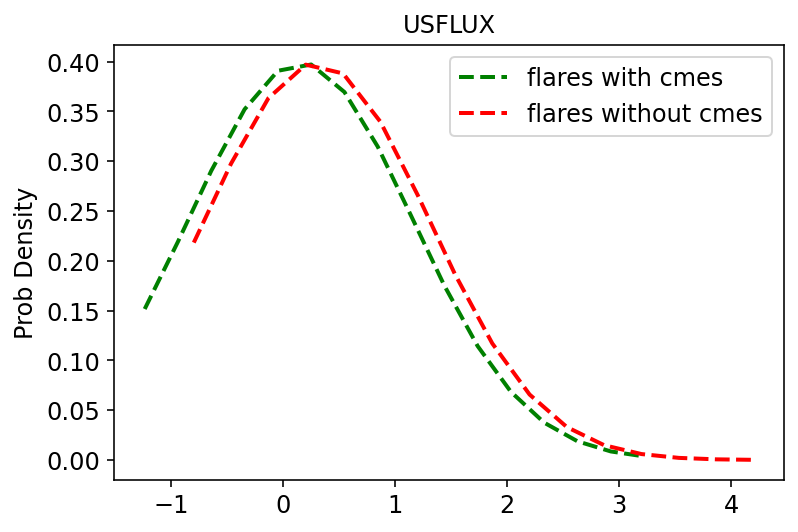

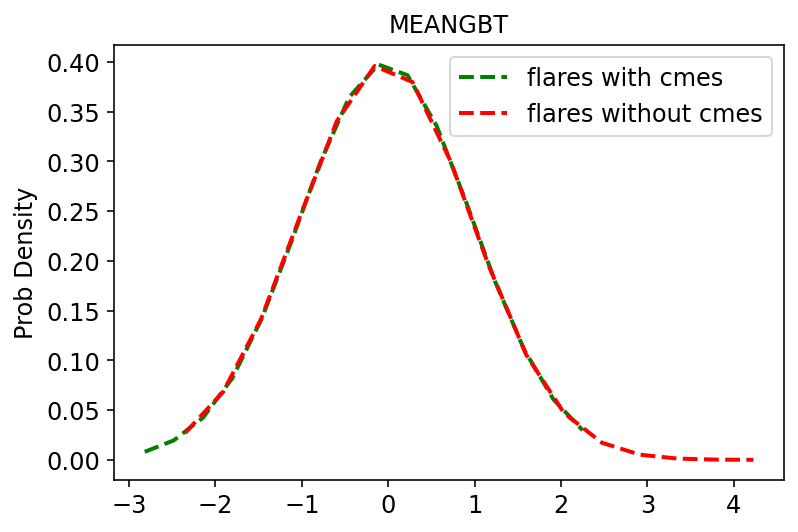

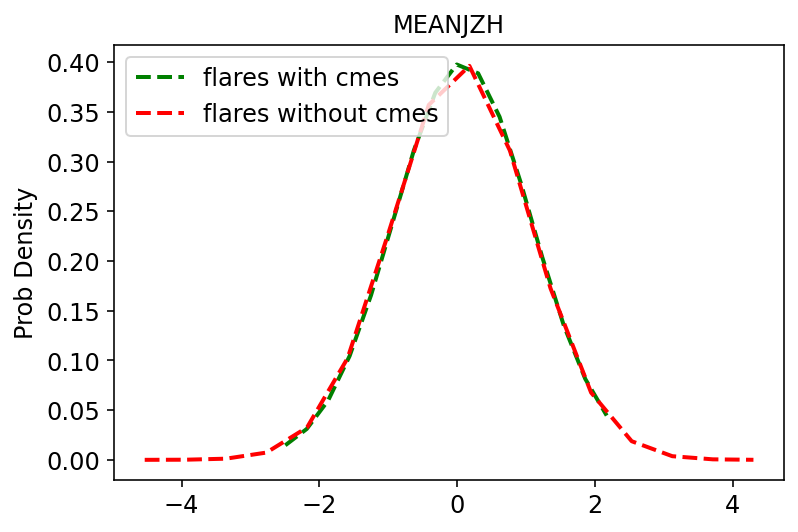

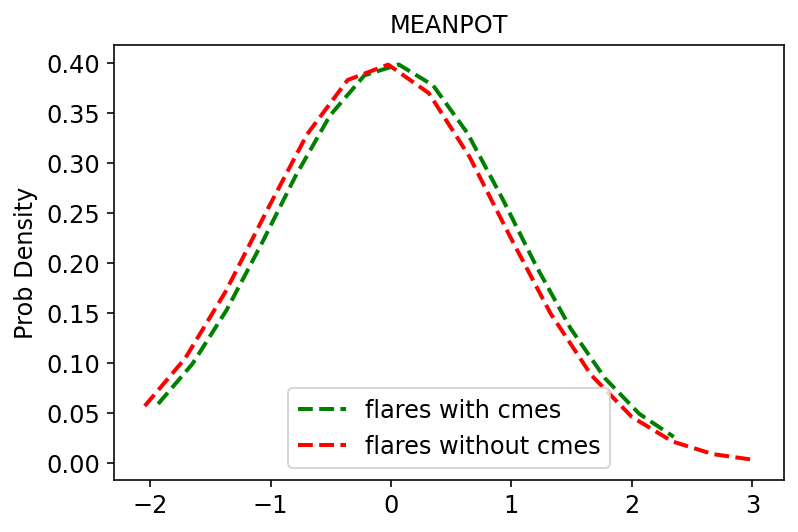

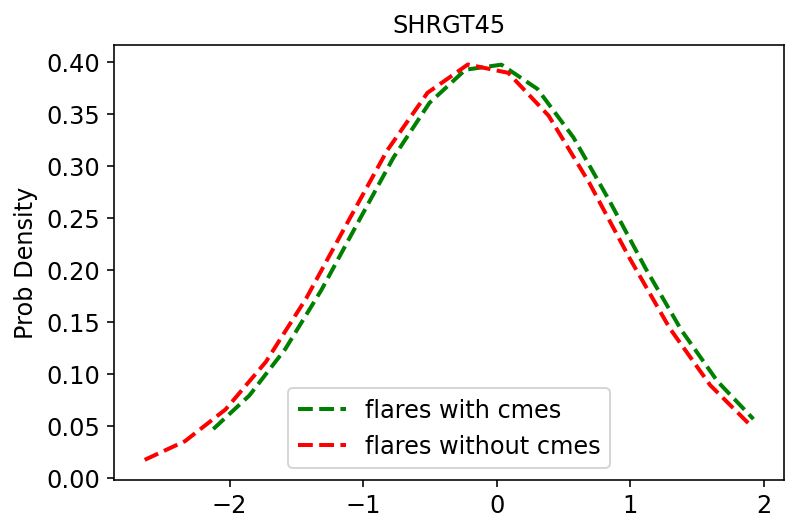

...

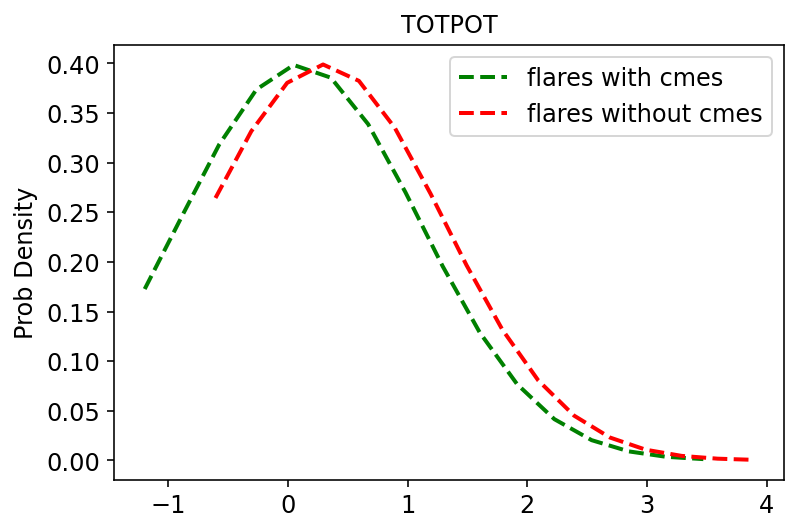

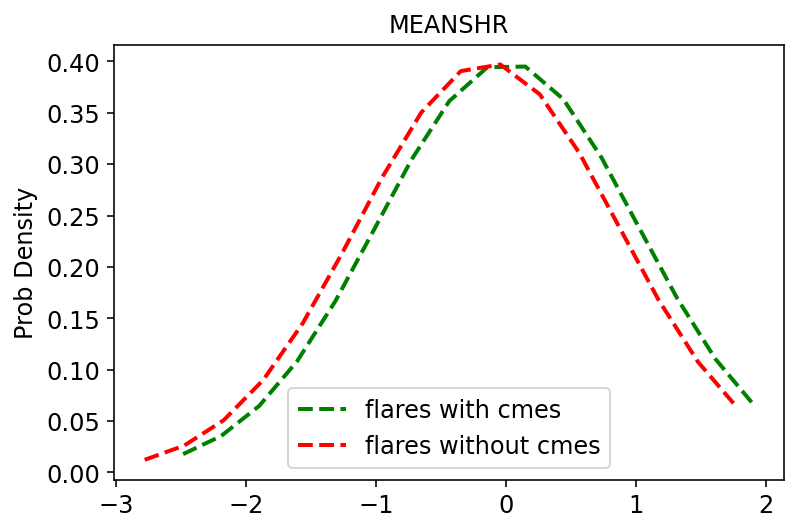

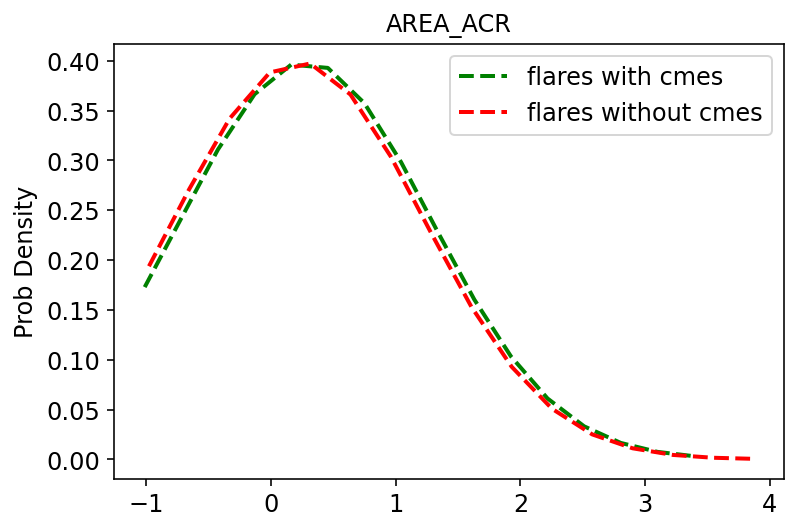

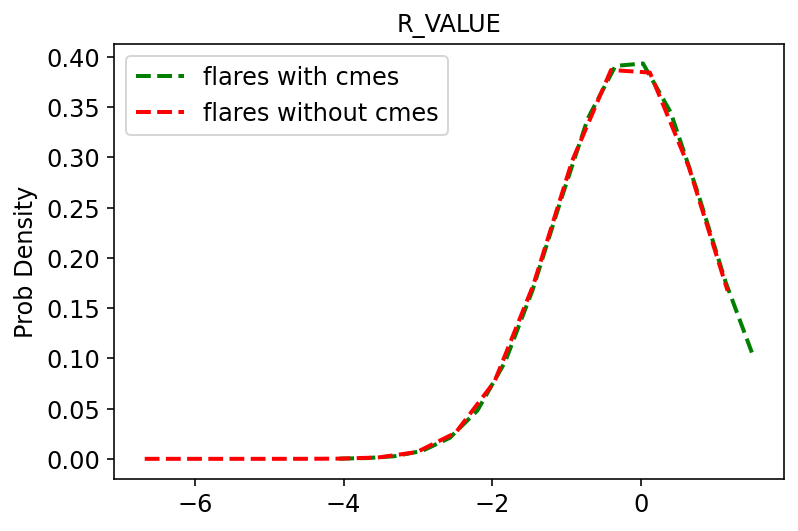

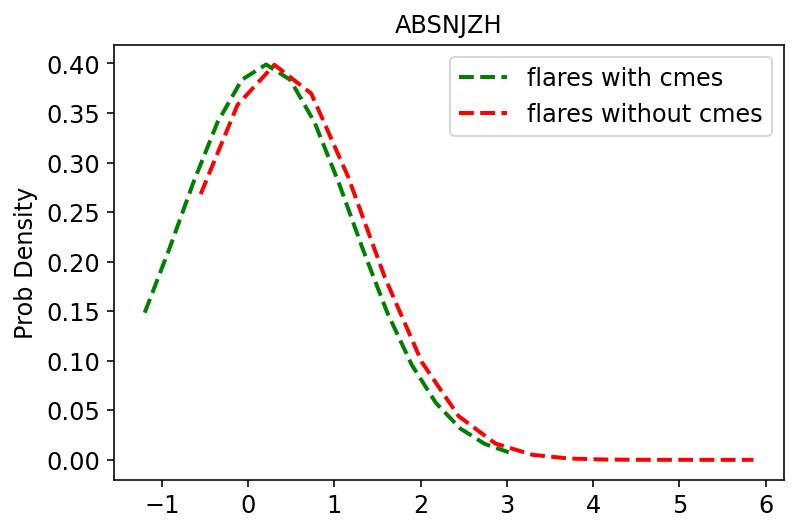

In [ ]:
for i in range(0,18):
    #plt.subplots(1,5,j+1, figsize=(5,5))
    histogram(CME_data_36,no_CME_data_36,i)

In [ ]:
CME_data=[CME_data_8,CME_data_12,CME_data_24,CME_data_36,CME_data_48]
no_CME_data=[no_CME_data_8,no_CME_data_12,no_CME_data_24,no_CME_data_36,no_CME_data_48]

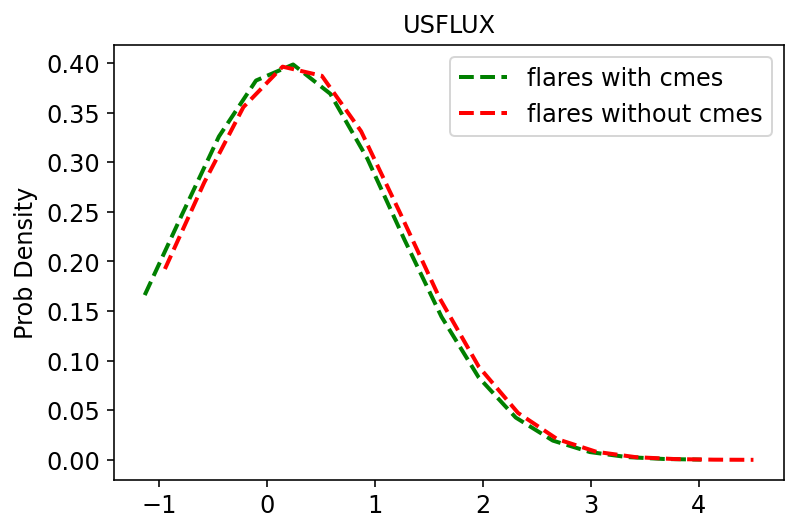

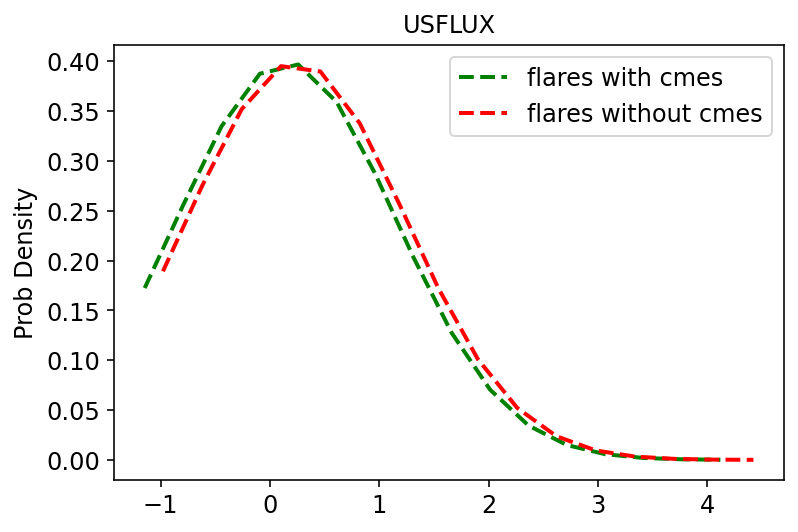

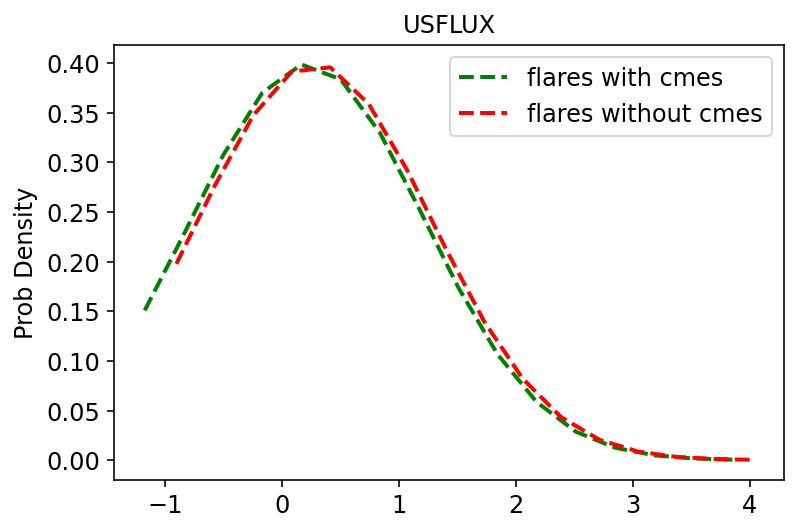

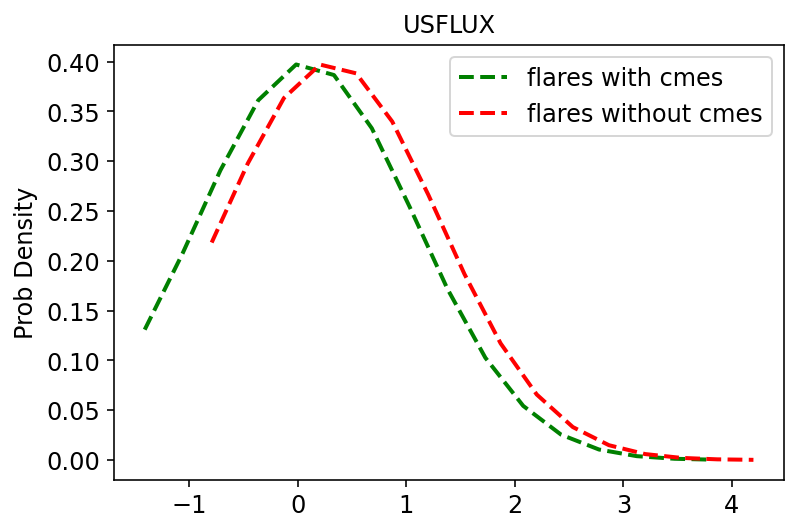

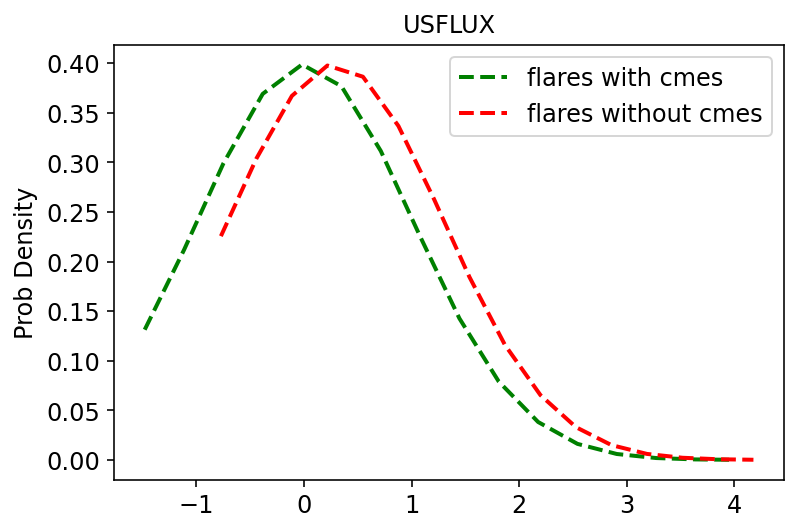

...

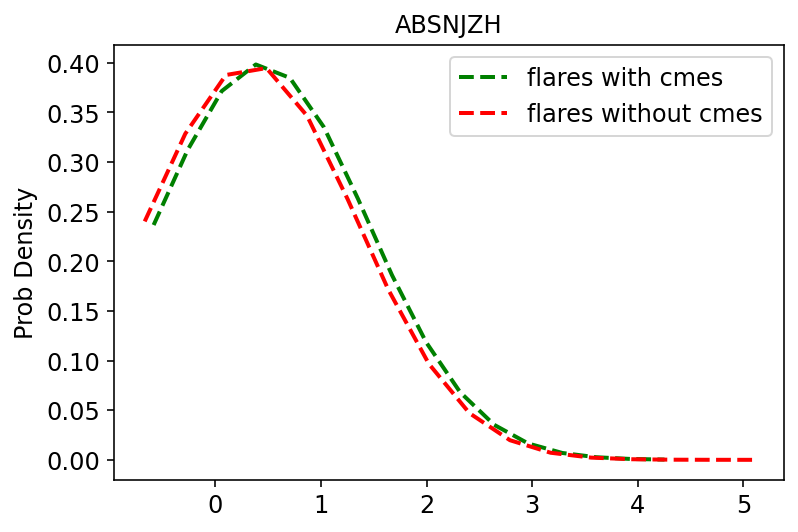

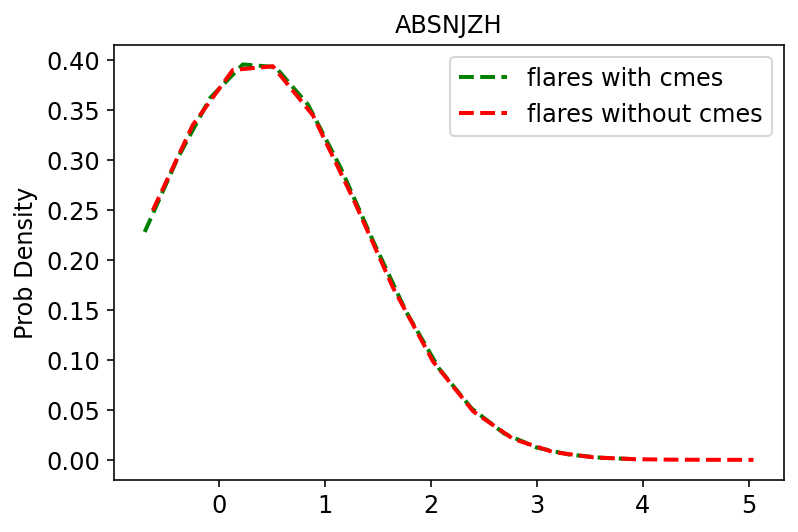

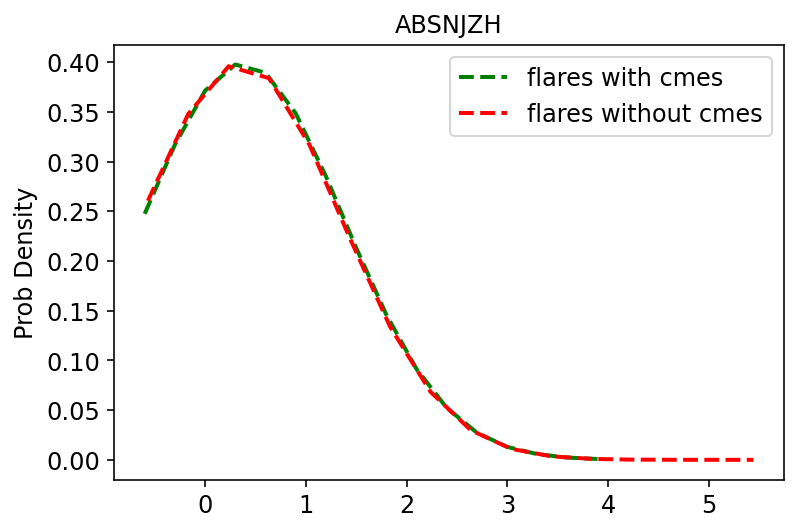

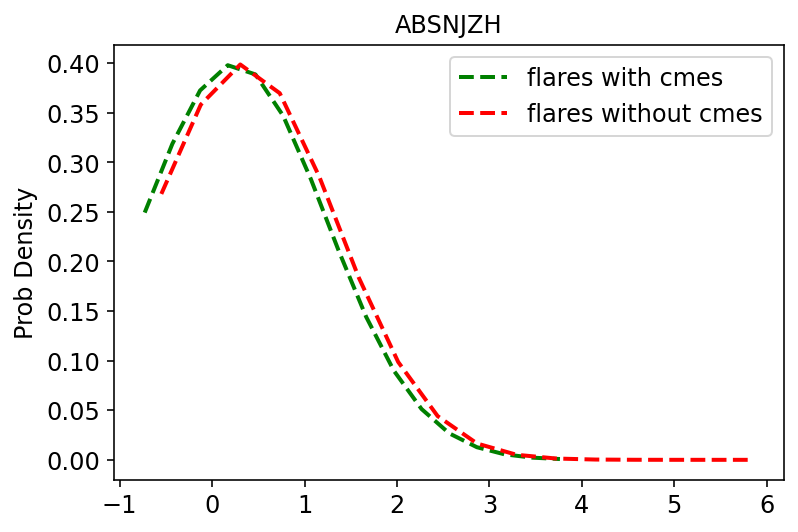

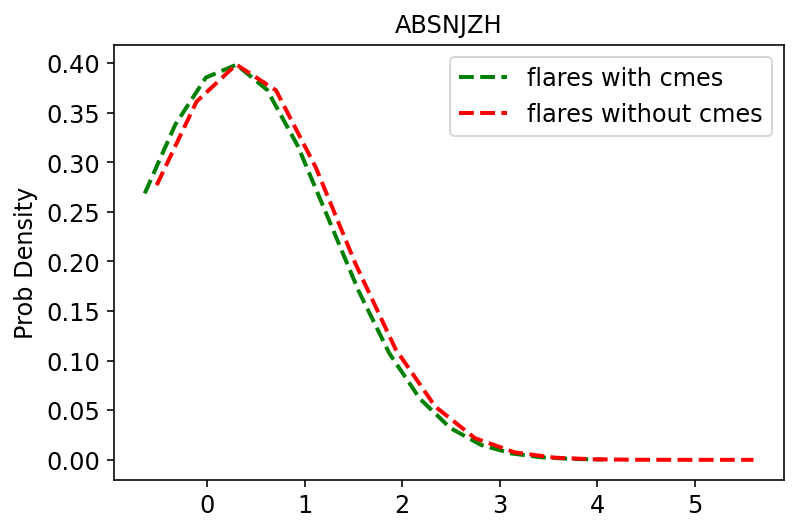

In [ ]:
for i in range(0,18):
  for j in range(0,5):
    #plt.subplots(1,5,j+1, figsize=(5,5))
    CME_data_n=CME_data[j]
    no_CME_data_n=no_CME_data[j]
    histogram(CME_data_n,no_CME_data_n,i)

In [ ]:
#with change histogram


## DATA Processing

Normalizing the data

In [ ]:
def normalize_the_data(flare_data):
    flare_data = np.array(flare_data)
    n_elements = flare_data.shape[0]
    for j in range(flare_data.shape[1]):
        standard_deviation_of_this_feature = np.std(flare_data[:,j])
        median_of_this_feature = np.median(flare_data[:,j])
        for i in range(n_elements):
            flare_data[i,j] = (flare_data[i,j] - median_of_this_feature) / (standard_deviation_of_this_feature)
    return flare_data



##Data processing for positive and negative class

In [ ]:
##seaprating the same AR from training and testing
import pandas as pd
def data_gen(positive_cl,negative_cl):
  CME_data=positive_cl.iloc[:,5:23]
  no_CME_data=negative_cl.iloc[:,5:23]
  no_CME_data= normalize_the_data(no_CME_data)
  CME_data= normalize_the_data(CME_data)

  #print("There are", no_CME_data.shape[0], "flares with no associated CMEs.")
  #print("There are", CME_data.shape[0], "flares with associated CMEs.")
  # select the number of features
  N_features = 18
  Nfl = CME_data.shape[0]
  Nnofl = no_CME_data.shape[0]
  yfl = np.ones(Nfl)
  ynofl = np.zeros(Nnofl)
  number_of_examples = Nfl + Nnofl

  #svm1 = svm.SVC(C=C, gamma=gamma, kernel='rbf', class_weight=class_weight,
  #           cache_size=500, max_iter=-1, shrinking=True, tol=1e-8, probability=True)
  #xdata_cme =np.concatenate((positive_cl.iloc[:,0:5],CME_data),axis=1)
  #xdata_no_cme=np.concatenate((negative_cl.iloc[:,0:5],no_CME_data),axis=1)
  xdata = np.concatenate((CME_data, no_CME_data), axis=0)
  ydata = np.concatenate((np.ones(Nfl), np.zeros(Nnofl)), axis=0)
  shuffle_index = np.arange(len(ydata))                  # shuffle the data indices
  np.random.shuffle(shuffle_index)
  ydata_shuffled = ydata[shuffle_index]
  xdata_shuffled = xdata[shuffle_index,:]
  #speed_index=xdata
  return CME_data,no_CME_data,xdata_shuffled,ydata_shuffled

In [ ]:
CME_data,no_CME_data,xdata_shuffled,ydata_shuffled=data_gen(positive_class_36,negative_class_36)

In [ ]:
xdata_shuffled=pd.DataFrame(xdata_shuffled)

In [ ]:
tot_data=np.concatenate((xdata_shuffled,ydata_shuffled.reshape(-1,1)),axis=1)

In [ ]:
tot_data=pd.DataFrame(tot_data)

In [ ]:
xdata_shuffled_uniqueAR=tot_data.iloc[:,2].unique()
xdata_shuffled_uniqueAR

array([12422, 11515, 12473, 12277, 11726, 11936, 12644, 11513, 12673,
       11166, 12035, 11882, 11890, 12320, 11900, 11904, 11996, 12290,
       11976, 11620, 11476, 12192, 12445, 12017, 12297, 12036, 11286,
       11401, 11093, 11968, 11164, 11877, 12085, 12268, 11748, 11618,
       12497, 11261, 11339, 11389, 11429, 11301, 12322, 12241, 12106,
       12205, 11875, 11967, 11986, 11263, 11314, 11974, 12371, 11946,
       11387, 12365, 11897, 12423, 12335, 11613, 11302, 11190, 12222,
       12182, 11402, 11165, 12403, 11112, 12249, 11928, 11149, 12080,
       12381, 11745, 11583, 12325, 12065, 11692, 11176, 11466, 11731,
       12014, 11303, 11471, 11162, 11520, 11283, 11943, 12209, 11540,
       11865, 11884, 11532, 11560, 11158, 11944, 11977, 12415, 12567,
       12130, 12242, 11295, 11161, 12011, 11504, 11342, 12253, 11195,
       11430, 11934, 12367, 11226, 12087, 11991, 11432, 11989, 12443,
       11909, 12089, 11346, 11818, 11893, 12010, 11654, 11652, 11760,
       12280, 12051,

In [ ]:
len(xdata_shuffled)

488

In [ ]:
len(xdata_shuffled[xdata_shuffled.iloc[:,2]==11476])

7

In [ ]:
xdata_shuffled[xdata_shuffled.iloc[:,2]==i]

,0,1,2,3,4,5,6,7,8,9,...,13,14,15,16,17,18,19,20,21,22
487,333,5415,12320,M1.4,2015.04.07_02:43_TAI,-0.351024,1.228586,0.601299,-1.287777,-1.162966,...,-0.76402,0.793786,0.679352,-0.458271,-0.130447,-0.430908,-1.058576,-0.190663,-1.079598,-0.228104


In [ ]:
repeated=0
non_unique_ar=[]
unique_ar=[]
for i in (xdata_shuffled_uniqueAR):
  if len(tot_data[tot_data.iloc[:,2]==i])>1:
     repeated+=1
     non_unique_ar.append(i)
  else:
    unique_ar.append(i)


In [ ]:
len(xdata_shuffled_uniqueAR)

155

In [ ]:
test_data=tot_data[tot_data.iloc[:,2].isin(unique_ar)]

In [ ]:
test_data[test_data.iloc[:,23]==1]

,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
30,39,3999,12036,M7.3,2014.04.17_01:03_TAI,-0.479964,0.058668,0.182287,0.224656,1.374195,...,-0.13784,1.814613,0.020866,-0.442218,-0.085186,1.335538,0.10178,-0.253547,-0.513057,1.0
130,23,2739,11745,M5.0,2013.05.21_01:32_TAI,-0.41875,-0.528388,-0.138781,-1.499773,-1.912815,...,-0.870877,0.0,-0.720935,-0.663675,-0.755964,-1.895593,-0.432977,-3.434619,-0.608984,1.0
159,6,833,11283,X1.8,2011.09.06_10:38_TAI,-0.952712,0.974684,0.411081,-0.179616,0.333522,...,0.611512,1.881437,-0.595119,-0.270864,-0.560629,0.363287,-0.060931,-0.732468,-0.454048,1.0
160,33,3563,11943,M4.0,2014.01.03_07:46_TAI,2.907518,-1.415255,0.41433,0.070918,-0.433633,...,-1.275019,0.204533,2.132347,1.392182,1.870836,-0.230553,2.010988,0.849851,0.881023,1.0
190,35,3563,11944,X1.2,2014.01.06_06:32_TAI,2.079745,0.015095,0.792286,1.465071,0.915081,...,0.0,1.091966,2.664097,1.902517,2.920804,0.960377,2.825929,0.94141,1.812781,1.0
217,16,1750,11504,M1.2,2012.06.12_01:17_TAI,-0.367898,0.330967,0.23898,-0.312748,0.115054,...,0.410546,-0.163571,-0.237363,-0.634007,-0.33167,0.203695,-0.15224,0.068082,-0.464182,1.0
228,11,1449,11430,X1.3,2012.03.05_13:14_TAI,0.28782,-0.840542,-1.455256,1.288634,0.430802,...,-0.016468,0.166878,0.229835,1.475162,0.60671,0.650947,0.17538,0.779421,1.214291,1.0
236,3,637,11226,M2.5,2011.06.05_18:41_TAI,-0.678161,1.345805,0.439208,-1.1895,-1.33739,...,0.98554,0.597457,-0.613587,-0.040374,-0.723795,-1.148382,-0.243018,-0.847503,-0.342739,1.0
251,67,6063,12443,M3.7,2015.11.03_01:52_TAI,-0.101081,0.457153,0.133409,0.054332,0.637946,...,0.191817,1.102618,0.285037,-0.134276,0.126742,0.716254,0.715488,-0.061039,-0.512616,1.0
269,32,3364,11893,X1.0,2013.11.17_22:26_TAI,0.325416,0.107299,0.457551,-0.301355,-0.560641,...,0.255781,-0.846776,0.26674,-0.018296,0.000474,-0.539558,0.181512,0.558742,0.01256,1.0


In [ ]:
negative_class_36

,Unnamed: 0,0,1,2,3,4,5,6,7,8,...,13,14,15,16,17,18,19,20,21,peaktime_flare
0,0,8,11069,M1.2,2010.05.04_05:19_TAI,1.308519e+21,109.914,-0.005754,2005.300,16.110,...,111.273,-0.300282,2.000745e+12,4.222512e+11,6.380853e+21,29.796,35.070248,0.000,13.774,2010-05-05 17:19:00
1,1,115,11093,M1.0,2010.08.06_06:24_TAI,1.748676e+22,86.809,-0.005398,6107.613,20.115,...,87.949,-0.262190,1.906497e+13,3.886959e+12,2.221003e+23,30.611,427.937958,3.821,147.800,2010-08-07 18:24:00
2,2,211,11112,M2.9,2010.10.15_07:12_TAI,8.635886e+21,145.208,0.001882,3380.575,7.040,...,144.410,0.482515,1.350948e+13,3.217496e+12,5.720140e+22,24.878,709.764587,3.426,23.975,2010-10-16 19:12:00
3,3,345,11149,M1.3,2011.01.26_13:03_TAI,2.208835e+22,77.458,0.003189,7058.576,21.203,...,83.284,-0.452133,2.088871e+13,7.186058e+12,2.921531e+23,28.830,564.053101,4.190,99.387,2011-01-28 01:03:00
4,4,362,11153,M1.9,2011.02.07_13:31_TAI,6.968897e+21,113.469,-0.002469,3649.218,10.467,...,120.948,-0.016955,9.377741e+12,2.097685e+12,4.741158e+22,27.293,199.341080,3.947,24.150,2011-02-09 01:31:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
406,406,7115,12673,M2.9,2017.09.07_03:47_TAI,5.385992e+22,98.171,-0.041231,18121.720,40.172,...,112.411,-0.205572,8.408268e+13,7.414323e+13,1.580492e+24,41.332,1798.567505,5.124,2707.563,2017-09-08 15:47:00
407,407,7115,12673,M2.1,2017.09.07_11:45_TAI,5.589888e+22,92.025,-0.033802,15771.350,37.870,...,106.153,-0.148672,8.243821e+13,6.974265e+13,1.504378e+24,40.680,1902.733887,5.098,2427.725,2017-09-08 23:45:00
408,408,7115,12673,M1.1,2017.09.07_16:28_TAI,5.568727e+22,93.463,-0.039639,15633.800,35.654,...,107.834,-0.193665,8.008970e+13,7.510749e+13,1.435366e+24,39.523,1905.425781,4.968,2740.330,2017-09-09 04:28:00
409,409,7115,12673,M3.7,2017.09.07_23:04_TAI,5.897912e+22,86.415,-0.024939,13365.180,32.125,...,100.447,-0.088491,7.897332e+13,4.546106e+13,1.319040e+24,37.132,1857.903198,4.919,1853.237,2017-09-09 11:04:00


In [ ]:
import pandas as pd
def data_gen(positive_cl,negative_cl):
  CME_data=positive_cl.iloc[:,5:23]
  no_CME_data=negative_cl.iloc[:,5:23]
  no_CME_data = normalize_the_data(no_CME_data)
  CME_data = normalize_the_data(CME_data)

  #print("There are", no_CME_data.shape[0], "flares with no associated CMEs.")
  #print("There are", CME_data.shape[0], "flares with associated CMEs.")
  # select the number of features
  N_features = 18
  Nfl = CME_data.shape[0]
  Nnofl = no_CME_data.shape[0]
  yfl = np.ones(Nfl)
  ynofl = np.zeros(Nnofl)
  number_of_examples = Nfl + Nnofl

  #svm1 = svm.SVC(C=C, gamma=gamma, kernel='rbf', class_weight=class_weight,
  #           cache_size=500, max_iter=-1, shrinking=True, tol=1e-8, probability=True)
  xdata = np.concatenate((CME_data, no_CME_data), axis=0)
  ydata = np.concatenate((np.ones(Nfl), np.zeros(Nnofl)), axis=0)
  shuffle_index = np.arange(len(ydata))                  # shuffle the data indices
  np.random.shuffle(shuffle_index)
  ydata_shuffled = ydata[shuffle_index]
  xdata_shuffled = xdata[shuffle_index,:]
  speed_index=xdata
  return CME_data,no_CME_data,xdata_shuffled,ydata_shuffled

In [ ]:
def data_gen_change(positive_cl,negative_cl):
  CME_data=positive_cl
  no_CME_data=negative_cl
  no_CME_data = normalize_the_data(no_CME_data)
  CME_data = normalize_the_data(CME_data)

  #print("There are", no_CME_data.shape[0], "flares with no associated CMEs.")
  #print("There are", CME_data.shape[0], "flares with associated CMEs.")
  # select the number of features
  N_features = 36
  Nfl = CME_data.shape[0]
  Nnofl = no_CME_data.shape[0]
  yfl = np.ones(Nfl)
  ynofl = np.zeros(Nnofl)
  number_of_examples = Nfl + Nnofl
  #svm1 = svm.SVC(C=C, gamma=gamma, kernel='rbf', class_weight=class_weight,
  #           cache_size=500, max_iter=-1, shrinking=True, tol=1e-8, probability=True)
  xdata = np.concatenate((CME_data, no_CME_data), axis=0)
  ydata = np.concatenate((np.ones(Nfl), np.zeros(Nnofl)), axis=0)
  shuffle_index = np.arange(len(ydata))                  # shuffle the data indices
  np.random.shuffle(shuffle_index)
  ydata_shuffled = ydata[shuffle_index]
  xdata_shuffled = xdata[shuffle_index,:]
  return CME_data,no_CME_data,xdata_shuffled,ydata_shuffled

##Feature selection kbest

In [ ]:
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.feature_selection import chi2, f_regression

def feature_selection(positive_class,negative_class,method):
  if method==1:
    selector = SelectKBest(f_classif, k=18)
    CME_data,no_CME_data,xdata,ydata=data_gen(positive_class,negative_class)
  else:
    selector = SelectKBest(f_classif, k=36)
    CME_data,no_CME_data,xdata,ydata=data_gen_change(positive_class,negative_class)
  selector.fit(xdata, ydata)
  scores = -np.log10(selector.pvalues_)
  scores /= scores.max()
  return xdata,scores

In [ ]:
xdata_8,scores_8=feature_selection (positive_class_8,negative_class_8)
xdata_12,scores_12=feature_selection (positive_class_12,negative_class_12)
xdata_24,scores_24=feature_selection (positive_class_24,negative_class_24)
xdata_36,scores_36=feature_selection (positive_class_36,negative_class_36)
xdata_48,scores_48=feature_selection (positive_class_48,negative_class_48)

In [ ]:
#CME_data,no_CME_data,xdata,ydata=data_gen(positive_class_36,negative_class_36)
xdata_36,scores_36=feature_selection(positive_class_36,negative_class_36,1)
#xdata_36,scores_36=feature_selection(data_p24_new,data_n24_new,0)

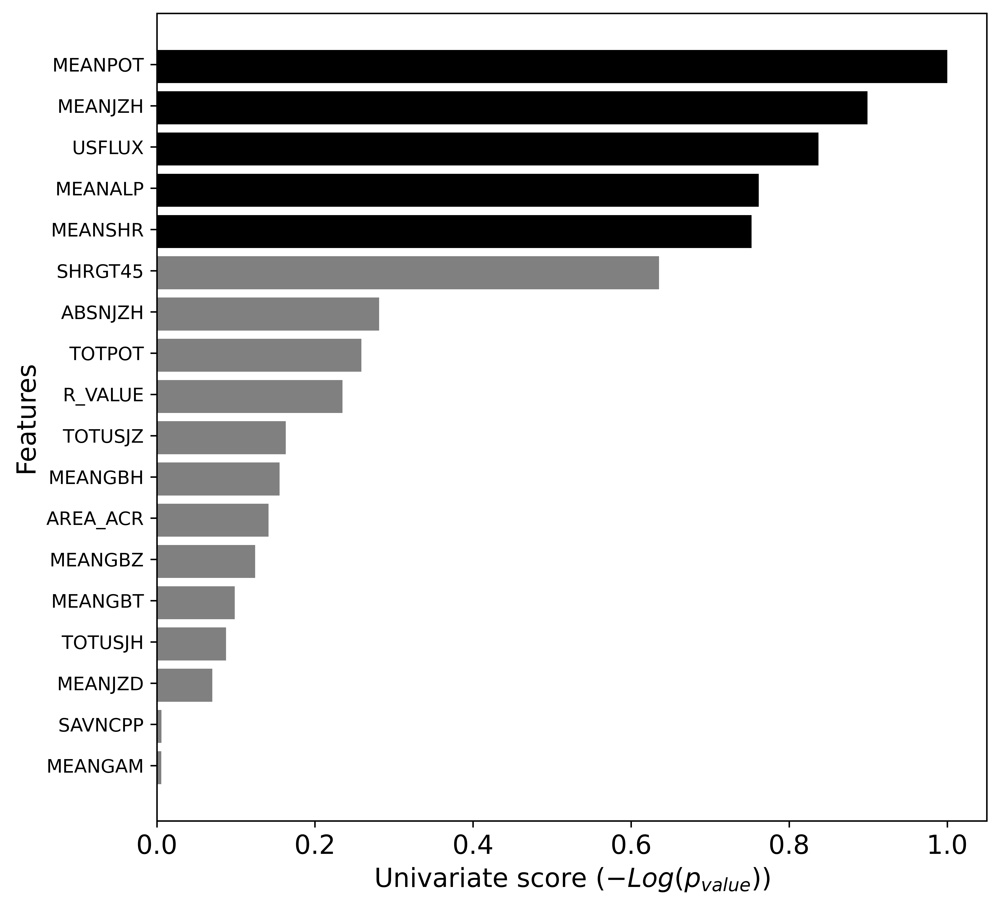

In [ ]:

import matplotlib.pyplot as plt
plt.figure(figsize=(8,8),dpi=400)

X_indices = np.arange(xdata_36.shape[-1])
plt.figure(1)
plt.clf()
#X_indices=(-X_indices).argsort()[:5]
clrs = ['grey' if (x < scores_36[(-scores_36).argsort()][4]) else 'black' for x in np.sort(scores_36) ]
plt.barh(X_indices - 0.05, np.sort(scores_36),color=clrs,alpha=1)
#clrs = ['grey' if (x < X_indices[-5 : ]) else 'red' for x in X_indices ]
#plt.bar(X_indices - 0.05, np.sort(scores_36)[0:5], color=clrs, width=0.4)
#plt.show()
#for i  in range(0,18):
#  if i<6:
#  plt.barh(X_indices - 0.05, np.sort(scores_36)[0:5],color='black')
#  plt.barh(X_indices - 0.05, np.sort(scores_36)[5:],color='black',alpha=0.7)
#plt.title("Feature univariate score_diff_36")
plt.ylabel("Features",fontsize=14)
plt.xlabel(r"Univariate score ($-Log(p_{value})$)",fontsize=14)
plt.xticks(fontsize=14)
plt.yticks(X_indices,np.array(col)[np.argsort(scores_36)],fontsize=10, rotation ='0')
plt.show()

##confusion table

In [ ]:
def confusion_table(pred, labels):
    """
    computes the number of TP, TN, FP, FN events given the arrays with predictions and true labels
    and returns the true skill score

    Args:
    pred: np array with predictions (1 for flare, 0 for nonflare)
    labels: np array with true labels (1 for flare, 0 for nonflare)

    Returns: true negative, false positive, true positive, false negative
    """
    Nobs = len(pred)
    TN = 0.
    TP = 0.
    FP = 0.
    FN = 0.
    for i in range(Nobs):
        if (pred[i] == 0 and labels[i] == 0):
            TN += 1
        elif (pred[i] == 1 and labels[i] == 0):
            FP += 1
        elif (pred[i] == 1 and labels[i] == 1):
            TP += 1
        elif (pred[i] == 0 and labels[i] == 1):
            FN += 1
        else:
            print("Error! Observation could not be classified.")
    return TN, FP, TP, FN

##Functions for sampling and ML models

In [ ]:
    ##model to be tried for sampling
from collections import Counter
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from sklearn.model_selection import train_test_split
from collections import Counter
from imblearn.over_sampling import SMOTE
    def without_sampling(X_train,y_train):
      return X_train, y_train
          ##undersampling majority class
    def RUS(X_train,y_train):
      rus= RandomUnderSampler(random_state=0)
      rus.fit(X_train,y_train)
      X_resampled, y_resampled = rus.fit_resample(X_train,y_train)
      return X_resampled, y_resampled
    def ROS(X_train,y_train):
      ros=RandomOverSampler(random_state=0)
      ros.fit(X_train,y_train)
      X_resampled, y_resampled = ros.fit_resample(X_train,y_train)
      return X_resampled, y_resampled
    ##SMOTE
    def SMOTE_test(X_train,y_train):
      oversample = SMOTE()
      X_resampled, y_resampled = oversample.fit_resample(X_train,y_train)
      return X_resampled, y_resampled
    def wo_costweight(X_train,y_train):
      return X_train,y_train



    #GAN
    #generating samples
    def GAN_generated(X_train,y_train):
      x,g_z= GAN(X_train,y_train)
      print( CheckAccuracy( x, g_z, data_cols, label_cols, seed=0, with_class=with_class, data_dim=data_dim ) )
      #PlotData( x, g_z, data_cols, label_cols, seed=0, with_class=with_class, data_dim=data_dim )
      xdata=np.append([X_train],[x[:,0:18]],axis=1)
      ydata=np.append([y_train],[x[:,-1]],axis=1)
    ##after GAN
      shuffle_index = np.arange(len(ydata))
      np.random.shuffle(shuffle_index)
      y_resampled = ydata[shuffle_index]
      X_resampled = xdata[shuffle_index,:]
      return (X_sampled,y_resampled)
    #returns same/costweight


##make TSS Scorer

In [ ]:
#make scorer
from sklearn.metrics import fbeta_score, make_scorer
def Tss_score(y_true, y_pred):
  TN, FP, TP, FN = confusion_table(y_pred, y_true)
  if (((TP+FN) == 0.0) or (FP+TN) == 0.0) or(FP+TP)==0.0:
    TSS=np.nan
  else:
    TSS=(TP/(TP+FN)) - (FP/(FP+TN))
  return TSS
tss_scorer=make_scorer(Tss_score)


##grid_Search_hyper_parameters


In [ ]:
#SVM
#C_range = np.logspace(-2, 10, 13)
#gamma_range = np.logspace(-9, 3, 13)
#param_grid = dict(gamma=gamma_range, C=C_range)
#param_grid = {'C': [0.1, 1, 3,4,6, 50,100],
#             'gamma': [1, 0.1, 0.01, 0.05, 0.07, 0.09, 0.005, 0.008, 0.0001],
 #             'gamma':['scale', 'auto'],
 #           'kernel': ['rbf']}

search_svm = GridSearchCV(SVC(), param_grid, refit = True, cv=cv,verbose = 3,n_jobs=-1, scoring=tss_scorer)

#lda
solver_range=['svd', 'lsqr', 'eigen']
shrinkage_range= np.arange(0, 1, 0.01)
param_grid_lda= dict(solver=solver_range,shrinkage=shrinkage_range)

#xgboost
param_grid_xgboost = {'gamma': [0.001,0.01,0.05,0.1,1,10],
              'learning_rate': [0.001, 0.01, 0.05,0.1],
              'max_depth': [2,6,10],
              'n_estimators': [20,30,50,100],}
XGboost = xgb.XGBClassifier()
##RF
param_grid_rf={
    'bootstrap': [True],
    'class_weight':['balanced'],
    'max_depth': [2,5,10],
    'max_features': [2, 3,5,10],
    'min_samples_leaf': [3, 5, 8],
    'min_samples_split': [8, 10, 12],
    'n_estimators': [5,10,20, 30]}
RF = RandomForestClassifier()

#DT

param_grid_dt={    'criterion' :['gini', 'entropy'],
               'splitter':['best'],
               'class_weight':['balanced'],
    'max_depth' : [2,6,10,12],
    'max_features': [2, 3,5,10]}

DT=DecisionTreeClassifier()


#LR
param_grid_lr={'penalty': ['l1', 'l2'],'C':[0.001,.01,0.05,.1,1.5,10]}
LR=LogisticRegression()

##adboost
param_grid_ab={'n_estimators': [5,10,20, 50],
    'learning_rate': [0.001, 0.01, 0.05,0.1],
    'algorithm': ['SAMME', 'SAMME.R']
             }
Adaboost=AdaBoostClassifier(base_estimator=SVC())

##gradientboost
param_grid_gb={ 'n_estimators': [5,10,20, 50],
          "min_samples_split": np.linspace(0.1, 0.5, 4),
          "min_samples_leaf": np.linspace(0.1, 0.5, 4),
          "max_depth":[3,5,8],
          "max_features":["log2","sqrt"],}
GB = GradientBoostingClassifier()


In [ ]:
def grid_search(parameters,model):
  search_model=GridSearchCV(model, parameters, refit = True, cv=cv,verbose = 3,n_jobs=-1, scoring=tss_scorer)

  # summarize result
  result = search_model.fit(xdata1,ydata1)
  print('Best Score: %s' % search_model.best_score_)
  print('Best Hyperparameters: %s' % search_model.best_params_)
  return search_model

In [ ]:
grid_search(param_grid_xgboost,XGboost)

Fitting 10 folds for each of 288 candidates, totalling 2880 fits
Best Score: 0.9148148148148149
Best Hyperparameters: {'gamma': 0.05, 'learning_rate': 0.1, 'max_depth': 10, 'n_estimators': 100}


GridSearchCV(cv=RepeatedStratifiedKFold(n_repeats=2, n_splits=5, random_state=1),
             estimator=XGBClassifier(), n_jobs=-1,
             param_grid={'gamma': [0.001, 0.01, 0.05, 0.1, 1, 10],
                         'learning_rate': [0.001, 0.01, 0.05, 0.1],
                         'max_depth': [2, 6, 10],
                         'n_estimators': [20, 30, 50, 100]},
             scoring=make_scorer(Tss_score), verbose=3)

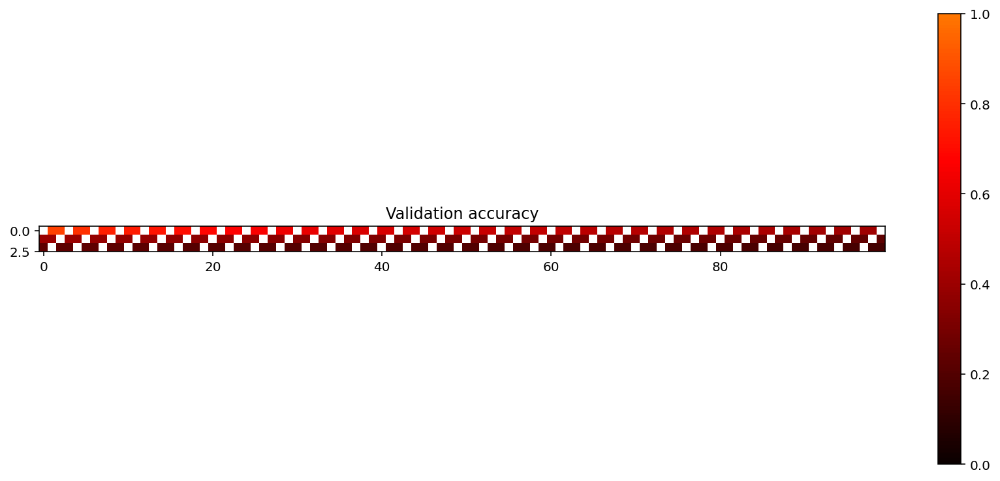

In [ ]:
##plot the hyperparameter range heatmap
from matplotlib.colors import Normalize
import matplotlib as mpl
class MidpointNormalize(mpl.colors.Normalize):
    def __init__(self, vmin, vmax, midpoint=0, clip=False):
        self.midpoint = midpoint
        mpl.colors.Normalize.__init__(self, vmin, vmax, clip)

    def __call__(self, value, clip=None):
        normalized_min = max(0, 1 / 2 * (1 - abs((self.midpoint - self.vmin) / (self.midpoint - self.vmax))))
        normalized_max = min(1, 1 / 2 * (1 + abs((self.vmax - self.midpoint) / (self.midpoint - self.vmin))))
        normalized_mid = 0.5
        x, y = [self.vmin, self.midpoint, self.vmax], [normalized_min, normalized_mid, normalized_max]
        return np.ma.masked_array(np.interp(value, x, y))


scores = search_lda.cv_results_["mean_test_score"].reshape(3,len(shrinkage_range))

plt.figure(figsize=(15, 6))
plt.subplots_adjust(left=0.2, right=0.95, bottom=0.15, top=0.95)
plt.imshow(
    scores,
    interpolation="nearest",
    cmap=plt.cm.hot,
    norm=MidpointNormalize(vmin=0,vmax=1,midpoint=0.92),
)
#plt.xlabel("gamma")
#plt.ylabel("C")
plt.colorbar()
#plt.xticks(np.arange(len(gamma_range)), gamma_range, rotation=45)
#plt.yticks(np.arange(len(C_range)), C_range)
plt.title("Validation accuracy")
plt.show()

##models without hyperparameter

In [ ]:
#SVM
from sklearn import svm
from sklearn.svm import SVC
from sklearn.svm import LinearSVC
def model_list_wo_hyper():
  #C = 4.0
  #gamma = 0.075
  #class_weight = {1: 6.5}
  #svm1 = svm.SVC(C=C, gamma=gamma, kernel='rbf', class_weight=None,
         #       cache_size=500, max_iter=-1, shrinking=True, tol=1e-8, probability=True)
  #svm1 = svm.SVC(C=C, gamma=gamma,probability=True, kernel='rbf', cache_size=500, max_iter=-1, shrinking=True, tol=1e-8)
  #svm2=LinearSVC(C=C,class_weight=None, max_iter=-1,tol=1e-8)

  #C = 4.0; gamma =0.0088; class_weight = {1:6.5}
  svm_cw = SVC(C=4.0, gamma=0.075, kernel='rbf', class_weight={1:6.5},   cache_size=500, max_iter=-1, shrinking=True, tol=1e-8, probability=True)
  svm1 = SVC(C=4.0, gamma=0.075, kernel='rbf', class_weight=None,   cache_size=500, max_iter=-1, shrinking=True, tol=1e-8, probability=True)
  clf = SVC(C=4.0, gamma=0.0088,probability=True, kernel='rbf',class_weight={1:6.5}, cache_size=500, max_iter=-1, shrinking=True, tol=1e-8)
  #XGBOOST
  import xgboost as xgb
  XGboost = xgb.XGBClassifier(objective="reg:logistic")
  #RF
  from sklearn.ensemble import RandomForestClassifier
  RF = RandomForestClassifier(n_estimators=100,max_depth=None,class_weight='balanced')
  #Decisiontree
  from sklearn.tree import DecisionTreeClassifier
  DT=DecisionTreeClassifier(splitter='best',class_weight='balanced')

  #Logisticregression
  from sklearn.linear_model import LogisticRegression
  LR=LogisticRegression(class_weight='balanced')

  #ELNET

  from sklearn.linear_model import ElasticNet
  ELNET=ElasticNet()

  #Naivebayes
  from sklearn.naive_bayes import GaussianNB
  Bayes = GaussianNB()

  #Adaboost

  from sklearn.ensemble import AdaBoostClassifier
  Adaboost=AdaBoostClassifier(base_estimator=LR,n_estimators=100)

  #KNN
  from sklearn.neighbors import KNeighborsClassifier
  KNN = KNeighborsClassifier(n_neighbors=5)

  #Balanced bagging
  from imblearn.ensemble import BalancedBaggingClassifier
  Balancedbagging = BalancedBaggingClassifier(base_estimator=DecisionTreeClassifier(),n_estimators=100,sampling_strategy='auto',replacement=False)
  Balancedbagging1 = BalancedBaggingClassifier(base_estimator=SVC(),n_estimators=100,sampling_strategy='auto',replacement=False)
  #LDA
  from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
  LDA = LinearDiscriminantAnalysis()

  #Gradient boosting
  from sklearn.ensemble import GradientBoostingClassifier
  GB = GradientBoostingClassifier(n_estimators=100)
  return svm_cw,svm1,clf,LDA,XGboost,RF,DT,LR,Adaboost,GB


##Actualmodel

In [ ]:

def model_uncertainty(positive_cl,negative_cl,kfolds,sampling,n):

      method1=['svm_cw','svm','LDA','XGboost','RF','DT','LR','GB','Adaboost']
      svm_cw,svm1,clf,LDA,XGboost,RF,DT,LR,Adaboost,GB= model_list_wo_hyper()
      if n==0:
        method=[svm_cw,svm1,LDA,XGboost,RF,DT,LR,GB,Adaboost]
      else:
        method=[clf,LDA,XGboost,RF,DT,LR,GB,Adaboost] ##change for change information

################################################################
      skf = StratifiedKFold(n_splits=kfolds, shuffle=True)

      these_TSS_for_this_k = []
      far_array=[]
      fdr_array=[]
      pod_array=[]

##shuffling data

      CME_data,no_CME_data,xdata_shuffled,ydata_shuffled=data_gen(positive_cl,negative_cl)
      for train_index, test_index in skf.split(xdata_shuffled, ydata_shuffled):

          xtest = xdata_shuffled[test_index]
          ytest = ydata_shuffled[test_index]
          xtrain2 = xdata_shuffled[train_index]
          ytrain2 = ydata_shuffled[train_index]

#sampling
          xtrain1,ytrain1=sampling(xtrain2,ytrain2)

##training with various models
          for i in range(0,9):
            method[i].fit(xtrain1, ytrain1)   ##fitting training set

##normalizing test set with median and standard deviation, derived from training set

            y_pred=method[i].predict(xtest)
            TN, FP, TP, FN = confusion_table(y_pred, ytest)
            if (((TP+FN) == 0.0) or (FP+TN) == 0.0) or(FP+TP)==0.0:
                these_TSS_for_this_k.append(np.nan)
                far_array.append(np.nan)
                fdr_array.append(np.nan)
                pod_array.append(np.nan)
                continue
            else:
                these_TSS_for_this_k.append(TP/(TP+FN) - FP/(FP+TN))
                FAR=(FP)/(FP+TN)
                POD=(TP)/(TP+FN)
                FDR= (FP)/(FP+TP)
                far_array.append(FAR)
                fdr_array.append(FDR)
                pod_array.append(POD)

      return (np.array(these_TSS_for_this_k),far_array,fdr_array,pod_array)

In [ ]:
##running model for 10 times, and aggregating the mean

def model_uncertainty(positive_cl,negative_cl,kfolds,sampling,n):

      method1=['svm1','LDA','XGboost','RF','DT','LR','GB','Adaboost']


      # xdata are the examples
      # ydata are the labels


      ##uncomment the desired model

      #CME_data,no_CME_data,xdata,ydata=data_gen(positive_cl,negative_cl)
      CME_data,no_CME_data,xdata,ydata=data_gen_change(positive_cl,negative_cl)   ##change for change information

  ##chose k

  # compute the TSS for a variety of k ranging from 2 to 52
  # this is to see how the TSS varies as a function of k, and to test if k=10 really makes sense
  #for k in range(2, 9):
      skf = StratifiedKFold(n_splits=kfolds, shuffle=True)
      these_TSS_for_this_k = []
      far_array=[]
      fdr_array=[]
      pod_array=[]
      for train_index, test_index in skf.split(xdata, ydata):
          svm1,clf,LDA,XGboost,RF,DT,LR,GB,Adaboost= model_list_wo_hyper()    ##change for change information
          if n==0:
            method=[svm1,LDA,XGboost,RF,DT,LR,GB,Adaboost]           ##change for change information
          # xtrain are the examples in the training set
          else:
            method=[clf,LDA,XGboost,RF,DT,LR,GB,Adaboost]
          xtrain2 = xdata[train_index]
          # ytrain are the labels in the training set
          ytrain2 = ydata[train_index]
          xtrain1,ytrain1=sampling(xtrain2,ytrain2)
          # xtest are the examples in the testing set
          xtest = xdata[test_index]
          ytest = ydata[test_index]    # ytest are the labels in the testing set
          # metadata useful for interpreting with LIME
          #mtrain = mdata[train_index]
          # metadata useful for interpreting with LIME
          #mtest = mdata[test_index]
          #ROS
          #if sampling==ROS:
           # xtrain, ytrain=ROS(xtrain1,ytrain1)
          #elif sampling==RUS:
           # xtrain, ytrain=ROS(xtrain1,ytrain1)
          for i in range(0,8):
            method[i].fit(xtrain1, ytrain1)
            y_pred=method[i].predict(xtest)
            TN, FP, TP, FN = confusion_table(y_pred, ytest)
            if (((TP+FN) == 0.0) or (FP+TN) == 0.0) or(FP+TP)==0.0:
                these_TSS_for_this_k.append(np.nan)
                far_array.append(np.nan)
                fdr_array.append(np.nan)
                pod_array.append(np.nan)
                continue
            else:
                these_TSS_for_this_k.append(TP/(TP+FN) - FP/(FP+TN))
                FAR=(FP)/(FP+TN)
                POD=(TP)/(TP+FN)
                FDR= (FP)/(FP+TP)
                far_array.append(FAR)
                fdr_array.append(FDR)
                pod_array.append(POD)

      return (np.array(these_TSS_for_this_k),far_array,fdr_array,pod_array)

##yearbyyear testing


In [ ]:
median_f=[]
std_f=[]
def normalize_the_data_median(flare_data):
    flare_data = np.array(flare_data)
    n_elements = flare_data.shape[0]
    for j in range(flare_data.shape[1]):
        standard_deviation_of_this_feature = np.std(flare_data[:,j])
        median_of_this_feature = np.median(flare_data[:,j])
        median_f.append(median_of_this_feature)
        std_f.append(standard_deviation_of_this_feature)
        for i in range(n_elements):
            flare_data[i,j] = (flare_data[i,j] - median_of_this_feature) / (standard_deviation_of_this_feature)
    return flare_data,median_f,std_f



In [ ]:
import pandas as pd
def data_gen_year(positive_cl,negative_cl):
  CME_data=positive_cl.iloc[:,5:23]
  no_CME_data=negative_cl.iloc[:,5:23]
  N_features = 18
  Nfl = CME_data.shape[0]
  Nnofl = no_CME_data.shape[0]
  yfl = np.ones(Nfl)
  ynofl = np.zeros(Nnofl)
  number_of_examples = Nfl + Nnofl
  xdata = np.concatenate((CME_data, no_CME_data), axis=0)
  ydata = np.concatenate((np.ones(Nfl), np.zeros(Nnofl)), axis=0)

  #normalized_train_data,median_p_this_feature,standard_deviation_p_this_feature = normalize_the_data(xdata)
  shuffle_index = np.arange(len(ydata))                  # shuffle the data indices
  np.random.shuffle(shuffle_index)
  ydata_shuffled = ydata[shuffle_index]
  xdata_shuffled = xdata[shuffle_index,:]
  #train_data=np.concatenate((normalized_train_data,ydata.reshape(-1,1)),axis=1)
  return xdata_shuffled,ydata_shuffled

In [ ]:
def normalize_test(test_data,median_of_this_feature,standard_deviation_of_this_feature):
  for j in range(0,18):
    test_data[j] = (test_data[j] - median_of_this_feature[j]) / (standard_deviation_of_this_feature[j])
  return test_data

##don't run

In [ ]:
xtrain1,ytrain1=ROS(xdata_shuffled,ydata_shuffled)

In [ ]:
ytrain1


array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 0., 0., 0., 0., 0.,
       0., 1., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0.,
       0., 0., 0., 0., 1., 0., 1., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
       1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 1.,
       0., 0., 1., 0., 1., 1., 0., 1., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
       0., 0., 1., 0., 0., 0., 0., 0., 1., 0., 1., 1., 1., 0., 0., 0., 0.,
       0., 0., 1., 1., 0., 0., 0., 0., 1., 0., 0., 1., 0., 0., 1., 0., 0.,
       0., 0., 0., 0., 0., 0., 1., 0., 0., 1., 0., 0., 0., 0., 0., 1., 0.,
       0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 1., 0.,
       0., 0., 0., 0., 0., 1., 1., 0., 1., 0., 0., 0., 0., 0., 1., 1., 0.,
       0., 0., 0., 0., 0.

In [ ]:
ydata_shuffled

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 0., 0., 0., 0., 0.,
       0., 1., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0.,
       0., 0., 0., 0., 1., 0., 1., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
       1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 1.,
       0., 0., 1., 0., 1., 1., 0., 1., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
       0., 0., 1., 0., 0., 0., 0., 0., 1., 0., 1., 1., 1., 0., 0., 0., 0.,
       0., 0., 1., 1., 0., 0., 0., 0., 1., 0., 0., 1., 0., 0., 1., 0., 0.,
       0., 0., 0., 0., 0., 0., 1., 0., 0., 1., 0., 0., 0., 0., 0., 1., 0.,
       0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 1., 0.,
       0., 0., 0., 0., 0., 1., 1., 0., 1., 0., 0., 0., 0., 0., 1., 1., 0.,
       0., 0., 0., 0., 0.

In [ ]:
def year_testing(year_train,year_test):
  train_p_data=positive_class_36[positive_class_36['year'].isin(year_train)]
  train_n_data=negative_class_36[negative_class_36['year'].isin(year_train)]
  test_p_data=positive_class_36[positive_class_36['year'].isin(year_test)]
  test_n_data=negative_class_36[negative_class_36['year'].isin(year_test)]
  ##normailizing train data
  normalized_train_data,ydata,median_p_this_feature,standard_deviation_p_this_feature=data_gen_year(train_p_data,train_n_data)
  ##normailizing test data
  test_p1_data=test_p_data.iloc[:,5:23]
  test_n1_data=test_n_data.iloc[:,5:23]
  for i in range(0,len(test_p1_data)):
    test_p1_data.iloc[i,:]=normalize_test(test_p1_data.iloc[i,:],median_p_this_feature,standard_deviation_p_this_feature)
  for i in range(0,len(test_n1_data)):
    test_n1_data.iloc[i,:]=normalize_test(test_n1_data.iloc[i,:],median_p_this_feature,standard_deviation_p_this_feature)
  normalized_test_data=pd.DataFrame(np.concatenate((test_p1_data,test_n1_data),axis=0))
  ytest = np.concatenate((np.ones(len(test_p_data)), np.zeros(len(test_n_data))), axis=0)
  return normalized_train_data,ydata,normalized_test_data,ytest

In [ ]:
##running model for 10 times, and aggregating the mean

def model_uncertainty_year(train_x,train_y,test_x,test_y,sampling,n):
          these_TSS_for_this_k = []
          far_array=[]
          fdr_array=[]
          pod_array=[]
          method1=['svm1','LDA','XGboost','RF','DT','LR','GB','Adaboost']

          svm_cw,svm1,clf,LDA,XGboost,RF,DT,LR,Adaboost,GB= model_list_wo_hyper()    ##change for change information
          if n==0:
            method=[svm_cw,svm1,LDA,XGboost,RF,DT,LR,GB,Adaboost]           ##change for change information
          # xtrain are the examples in the training set
          else:
            method=[clf,LDA,XGboost,RF,DT,LR,GB,Adaboost]
          xtrain1,ytrain1=sampling(train_x,train_y)
          # xtest are the examples in the testing set
          xtest = test_x
          ytest = test_y   # ytest are the labels in the testing set
          for i in range(0,9):
            method[i].fit(xtrain1, ytrain1)
            y_pred=method[i].predict(xtest)
            TN, FP, TP, FN = confusion_table(y_pred, ytest)
            if (((TP+FN) == 0.0) or (FP+TN) == 0.0) or(FP+TP)==0.0:
                these_TSS_for_this_k.append(np.nan)
                far_array.append(np.nan)
                fdr_array.append(np.nan)
                pod_array.append(np.nan)
                continue
            else:
                these_TSS_for_this_k.append(TP/(TP+FN) - FP/(FP+TN))
                FAR=(FP)/(FP+TN)
                POD=(TP)/(TP+FN)
                FDR= (FP)/(FP+TP)
                far_array.append(FAR)
                fdr_array.append(FDR)
                pod_array.append(POD)

          return (np.array(these_TSS_for_this_k),far_array,fdr_array,pod_array)

##results_year_year

In [ ]:
#split training data and testing data
year_train=[2011,2012,2013,2014]
year_test=[2015,2016,2017]
print(year_train,year_test)


[2011, 2012, 2013, 2014] [2015, 2016, 2017]


In [ ]:
normalized_train_data,ydata,normalized_test_data,ytest=year_testing(year_train,year_test)

In [ ]:
SMOTE_test

In [ ]:
TSS_array,far_array,fdr_array,pod_array=model_uncertainty_year(normalized_train_data,ydata,normalized_test_data,ytest,SMOTE_test,0)

/usr/local/lib/python3.9/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


In [ ]:
TSS_array.reshape(-1,1)

array([[ 0.02139037],
       [ 0.04723708],
       [ 0.13190731],
       [ 0.01426025],
       [ 0.01426025],
       [ 0.1087344 ],
       [-0.0311943 ],
       [ 0.16755793],
       [ 0.01871658]])

In [ ]:
print(TSS.reshape,far_array,fdr_array,pod_array)

0.10561497326203212 [0.3382352941176471, 0.39705882352941174, 0.19852941176470587, 0.19117647058823528, 0.3235294117647059, 0.4632352941176471, 0.2426470588235294, 0.4338235294117647] [0.8363636363636363, 0.8059701492537313, 0.8181818181818182, 0.8125, 0.88, 0.8181818181818182, 0.868421052631579, 0.8194444444444444] [0.4090909090909091, 0.5909090909090909, 0.2727272727272727, 0.2727272727272727, 0.2727272727272727, 0.6363636363636364, 0.22727272727272727, 0.5909090909090909]


##testing with same median and standard deviation

In [ ]:
xdata_shuffled[0,:][0]

0.03076208780833735

In [ ]:

def model_uncertainty_median(positive_cl,negative_cl,kfolds,sampling,n):

      method1=['svm_cw','svm','LDA','XGboost','RF','DT','LR','GB','Adaboost']
      svm_cw,svm1,clf,LDA,XGboost,RF,DT,LR,Adaboost,GB= model_list_wo_hyper()
      if n==0:
        method=[svm_cw,svm1,LDA,XGboost,RF,DT,LR,GB,Adaboost]
      else:
        method=[clf,LDA,XGboost,RF,DT,LR,GB,Adaboost] ##change for change information

################################################################
      skf = StratifiedKFold(n_splits=kfolds, shuffle=True)

      these_TSS_for_this_k = []
      far_array=[]
      fdr_array=[]
      pod_array=[]

##shuffling data

      xdata_shuffled,ydata_shuffled=data_gen_year(positive_cl,negative_cl)
      for train_index, test_index in skf.split(xdata_shuffled, ydata_shuffled):

          xtest = xdata_shuffled[test_index]
          ytest = ydata_shuffled[test_index]
          xtrain2 = xdata_shuffled[train_index]
          ytrain2 = ydata_shuffled[train_index]

##normalizing training dataset
          normalized_train_data,median_p_this_feature,standard_deviation_p_this_feature = normalize_the_data_median(xtrain2) ##normalizing xdata

##normalizing test set with training median and sd
          for i in range(0,len(xtest)):
            xtest[i,:]=normalize_test(xtest[i,:],median_p_this_feature,standard_deviation_p_this_feature)
#sampling
          xtrain1,ytrain1=sampling(normalized_train_data,ytrain2)

##training with various models
          for i in range(0,9):
            method[i].fit(xtrain1, ytrain1)   ##fitting training set

##normalizing test set with median and standard deviation, derived from training set

            y_pred=method[i].predict(xtest)
            TN, FP, TP, FN = confusion_table(y_pred, ytest)
            if (((TP+FN) == 0.0) or (FP+TN) == 0.0) or(FP+TP)==0.0:
                these_TSS_for_this_k.append(np.nan)
                far_array.append(np.nan)
                fdr_array.append(np.nan)
                pod_array.append(np.nan)
                continue
            else:
                these_TSS_for_this_k.append(TP/(TP+FN) - FP/(FP+TN))
                FAR=(FP)/(FP+TN)
                POD=(TP)/(TP+FN)
                FDR= (FP)/(FP+TP)
                far_array.append(FAR)
                fdr_array.append(FDR)
                pod_array.append(POD)

      return (np.array(these_TSS_for_this_k),far_array,fdr_array,pod_array)

In [ ]:
TSS,FAR,FDR,POD=model_uncertainty_median(positive_class_36,negative_class_36,5,ROS,0)

/usr/local/lib/python3.9/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


In [ ]:
TSS,FAR,FDR,POD=model_uncertainty(positive_class_36,negative_class_36,5,SMOTE_test,0)

/usr/local/lib/python3.9/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


In [ ]:
TSS

array([0.94117647, 0.92867647, 0.77352941, 0.62205882, 0.66838235,
       0.65220588, 0.63970588, 0.58455882, 0.58970588, 0.68970588,
       0.70220588, 0.85367647, 0.51323529, 0.51323529, 0.43823529,
       0.72352941, 0.63088235, 0.53088235, 0.68088235, 0.68088235,
       0.71102941, 0.70220588, 0.39558824, 0.55955882, 0.74852941,
       0.61838235, 0.67352941, 0.75220588, 0.73970588, 0.72720588,
       0.71470588, 0.51323529, 0.63088235, 0.55955882, 0.53455882,
       0.49705882, 0.74852941, 0.71470588, 0.84485294, 0.52573529,
       0.50441176, 0.45073529, 0.83235294, 0.40808824, 0.65220588])

In [ ]:
TSS=np.array(TSS).reshape(5,9)

In [ ]:
TSS

array([[0.94117647, 0.92867647, 0.77352941, 0.62205882, 0.66838235,
        0.65220588, 0.63970588, 0.58455882, 0.58970588],
       [0.68970588, 0.70220588, 0.85367647, 0.51323529, 0.51323529,
        0.43823529, 0.72352941, 0.63088235, 0.53088235],
       [0.68088235, 0.68088235, 0.71102941, 0.70220588, 0.39558824,
        0.55955882, 0.74852941, 0.61838235, 0.67352941],
       [0.75220588, 0.73970588, 0.72720588, 0.71470588, 0.51323529,
        0.63088235, 0.55955882, 0.53455882, 0.49705882],
       [0.74852941, 0.71470588, 0.84485294, 0.52573529, 0.50441176,
        0.45073529, 0.83235294, 0.40808824, 0.65220588]])

##plotting_code


In [ ]:
##without sampling
##with sampling

##change_with_sampling
##change_without_sampling


In [ ]:
model_name: LinearDiscriminantAnalysis()
test_year= 2011 train_year= [2012, 2013, 2014, 2015, 2016, 2017]
0.927536231884058
test_year= 2012 train_year= [2011, 2013, 2014, 2015, 2016, 2017]
0.6237442922374429
test_year= 2013 train_year= [2011, 2012, 2014, 2015, 2016, 2017]
0.8751926040061633
test_year= 2014 train_year= [2011, 2012, 2013, 2015, 2016, 2017]
0.7283208020050125
test_year= 2015 train_year= [2011, 2012, 2013, 2014, 2016, 2017]
0.9054054054054054
test_year= 2016 train_year= [2011, 2012, 2013, 2014, 2015, 2017]
0.875
test_year= 2017 train_year= [2011, 2012, 2013, 2014, 2015, 2016]
0.7961538461538461

In [ ]:
##data

#3LDA_with_smote
LDA_sm_mean=[0.9310144927536232,
 0.6360730593607306,
 0.8746841294298922,
 0.6753283208020049,
 0.9232432432432434,
 0.875,
 0.7930769230769229]
LDA_sm_std=[0.010868598990871097,
 0.013902591185057824,
 0.009723260684246423,
 0.04544583712823129,
 0.014539435304121925,
 0.0,
 0.018589301497837805]

 ##svm_with_smote
SVM_sm_mean=[0.7449896480331265,
 0.5435981735159817,
 0.627642526964561,
 0.3383208020050125,
 0.5830445151033387,
 0.5033333333333334,
 0.40230769230769226]
SVM_sm_std=[0.0754243226607561,
 0.04159215731221789,
 0.07424483520659106,
 0.07445130769405035,
 0.020264020670672626,
 0.20813991020998887,
 0.03939633239169808]

##SVM_without_sampling
SVM_mean=[0.670807453416149,
 0.6118721461187214,
 0.6194144838212637,
 0.23659147869674185,
 0.638314785373609,
 1.0,
 0.3384615384615385]

SVM_std=[1.1102230246251565e-16,
 0.0,
 2.220446049250313e-16,
 0.0,
 0.0,
 0.0,
 5.551115123125783e-17]

#3LDA_without_sampling

LDA_mean=[0.9710144927536233,
 0.5863013698630138,
 0.8921417565485363,
 0.5558897243107769,
 0.9276629570747214,
 0.2083333333333333,
 0.8461538461538458]

LDA_std=[1.1102230246251565e-16,
 1.1102230246251565e-16,
 1.1102230246251565e-16,
 0.0,
 4.440892098500626e-16,
 2.7755575615628914e-17,
 3.3306690738754696e-16]



 ##LDA_change_smote
 [0.6881598062953994,
 0.6244481605351172,
 0.9106798245614033,
 0.4668541666666666,
 0.7018852459016397,
 0.5,
 0.48357843137254897]
 [0.015433038724960314,
 0.004345409956685479,
 0.012642900475790787,
 0.03561963288030602,
 0.01019034115929185,
 0.0,
 0.06719933893575544]

 ##SVM_change_samote

[0.23508474576271188,
 0.6393645484949834,
 0.7397587719298244,
 0.2881666666666666,
 0.5950204918032787,
 1.0,
 0.14]
[0.05620051886173155,
 0.03554935382722044,
 0.06438265966825818,
 0.05103858834254724,
 0.07713546191397014,
 0.0,
 0.058783973628494655]



 ##LDA_change_change_w/0_sampling

 [0.7554479418886197,
 0.6778149386845039,
 0.9473684210526316,
 0.4604166666666666,
 0.7141393442622952,
 0.5,
 0.25]

[0.0, 0.0, 0.0, 5.551115123125783e-17, 1.1102230246251565e-16, 0.0, 0.0]


##SVM
[0.36803874092009686,
 0.6343366778149385,
 0.8223684210526316,
 0.17916666666666667,
 0.6649590163934426,
 1.0,
 0.3333333333333334]


[5.551115123125783e-17,
 1.1102230246251565e-16,
 0.0,
 2.7755575615628914e-17,
 1.1102230246251565e-16,
 0.0,
 1.1102230246251565e-16]


In [ ]:
width1

[0.25, 1.25, 2.25, 3.25, 4.25, 5.25, 6.25]

<ipython-input-38-9d57b9819635>:45: MatplotlibDeprecationWarning: Passing the emit parameter of set_ylim() positionally is deprecated since Matplotlib 3.6; the parameter will become keyword-only two minor releases later.
  plt.ylim(0,1,0.1)


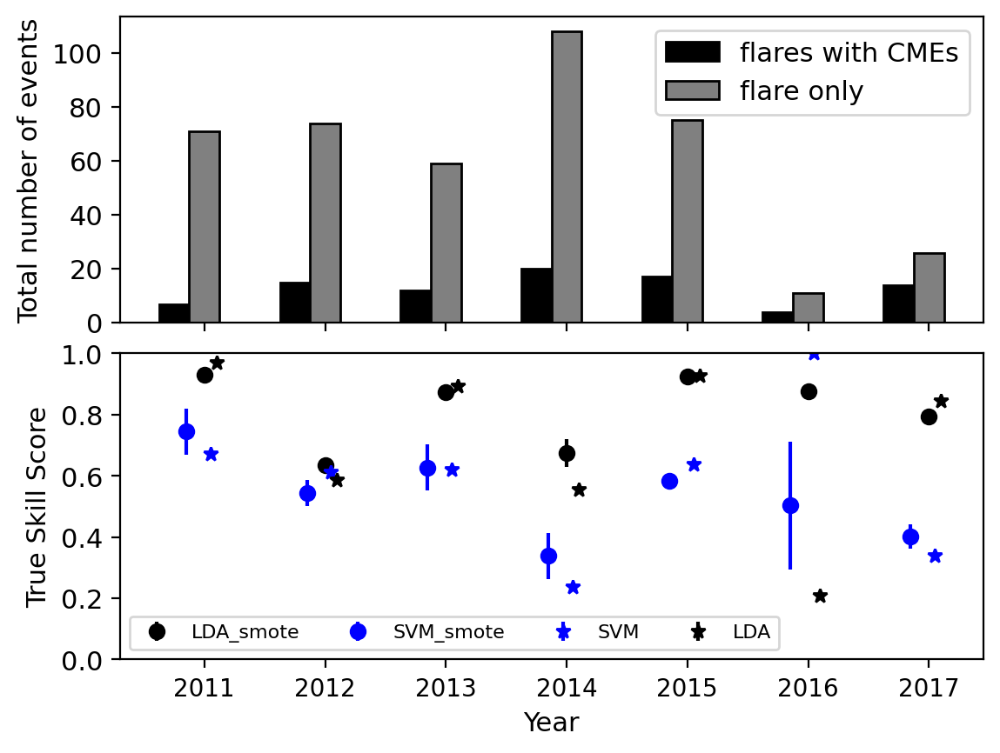

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import gridspec
year=['2011','2012','2013','2014','2015','2016','2017']
flares_cmes=[7,15,12,20,17,4,14]
flare_only=[71,74,59,108,75,11,26]
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
barWidth = 0.25
width=np.arange(0,len(year))
width1=[x + barWidth for x in width]
width2=[x + 0.1 for x in width]
width3=[x + 0.3 for x in width]
width4=[x + 0.35 for x in width]
fig = plt.figure(dpi=200)
# set height ratios for subplots
gs = gridspec.GridSpec(2,1, height_ratios=[1, 1])

# the first subplot
ax0 = plt.subplot(gs[0])
ax0.bar(width, flares_cmes, color ='black', width = 0.25, edgecolor ='black', label ='flares with CMEs')
ax0.bar(width1, flare_only, color ='gray', width = 0.25, edgecolor ='black', label ='flare only')
plt.xticks([r + barWidth for r in range(len(year))],
        ['2011','2012','2013','2014','2015','2016','2017'],fontsize=11)
plt.yticks(fontsize=11)
plt.ylabel("Total number of events",fontsize=11)

plt.legend(loc='best',fontsize=11)


# the second subplot
# shared axis X
ax1 = plt.subplot(gs[1], sharex = ax0)
ax1.errorbar(width1, LDA_sm_mean, yerr=LDA_sm_std,marker='o',
            linestyle='none',color='black',capthick=0.2,label='LDA_smote')
ax1.errorbar(width2, SVM_sm_mean, yerr=SVM_sm_std,marker='o',
            linestyle='none',color='blue',capthick=0.2,label='SVM_smote')
ax1.errorbar(width3, SVM_mean, yerr=SVM_std,marker='*',
            linestyle='none',color='blue',capthick=0.2,label='SVM')
ax1.errorbar(width4, LDA_mean, yerr=LDA_std,marker='*',
            linestyle='none',color='black',capthick=0.2,label='LDA')
plt.setp(ax0.get_xticklabels(), visible=False)
# remove last tick label for the second subplot
plt.ylim(0,1,0.1)
plt.yticks(fontsize=11)
plt.ylabel("True Skill Score",fontsize=11)
plt.xlabel("Year",fontsize=11)
plt.legend(fontsize=8,loc='lower left',ncol=4)
# remove vertical gap between subplots
plt.subplots_adjust(hspace=.1)
plt.show()

##plotting and visualization of samplings and timelags (SVM)


In [ ]:
wo_class_imbalance_36h_m= [0.52,0.78,0.37,0.36,0.42,0.7,0.62,0.4,]
wo_class_imbalance_36h_std=[0.15,0.09,0.09,0.12,0.08,0.06,0.08,0.07]

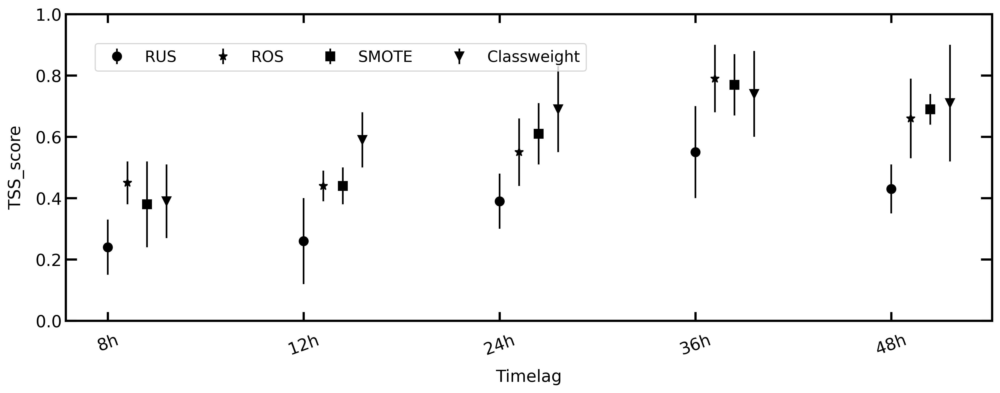

In [ ]:
svm_8h_mean=[0.24,0.45,0.38,0.39]
svm_8h_std= [0.09,0.07,0.14,0.12]


svm_12h_mean=[0.26,0.44,0.44,0.59]
svm_12h_std= [0.14,0.05,0.06,0.09]
5
svm_24h_mean=[0.39,0.55,0.61,0.69]
svm_24h_std= [0.09,0.11,0.1,0.14]

svm_36h_mean=[0.55,0.79,0.77,0.74]
svm_36h_std= [0.15,0.11,0.1,0.14]

svm_48h_mean=[0.43,0.66,0.69,0.71]
svm_48h_std= [0.08,0.13,0.05,0.19]
#*****************************************************************************
svm_rus_mean=[0.24,0.26,0.39,0.55,0.43]
svm_rus_std=[0.09,0.14,0.09,0.15,0.08]

svm_ros_mean=[0.45,0.44,0.55,0.79,0.66]
svm_ros_std=[0.07,0.05,0.11,0.11,0.13]

svm_sm_mean=[0.38,0.44,0.61,0.77,0.69]
svm_sm_std=[0.14,0.06,0.1,0.1,0.05]

svm_cw_mean=[0.39,0.59,0.69,0.74,0.71]
svm_cw_std=[0.12,0.09,0.14,0.14,0.19]


##plot
import numpy as np
import matplotlib.pyplot as plt
Method=['RUS','ROS','SMOTE','Cost_weight']
time_delay=['8h','12h','24h','36h','48h',]
x_pos_rus = np.arange(0,len(time_delay))
x_pos_ros=np.arange(0.1,len(time_delay)+0.1)
x_pos_sm=np.arange(0.2,len(time_delay)+0.2)
x_pos_cw=np.arange(0.3,len(time_delay)+0.3)
y_pos=np.arange(0,1,0.2)
# Build the plot
#fig = plt.figure()
fig,ax1 = plt.subplots(1,1,figsize=(15,5),dpi=200,sharey=True)
ax1.errorbar(x_pos_rus, svm_rus_mean, yerr=svm_rus_std,marker='o', markersize=8,
            linestyle='none',color='black',capthick=0.2,label='RUS')
ax1.errorbar(x_pos_ros, svm_ros_mean, yerr=svm_ros_std,marker='*', markersize=8,
            linestyle='none',color='black',capthick=0.2,label='ROS')
ax1.errorbar(x_pos_sm, svm_sm_mean, yerr=svm_sm_std,marker='s', markersize=8,
            linestyle='none',color='black',capthick=0.2,label='SMOTE')
ax1.errorbar(x_pos_cw, svm_cw_mean, yerr=svm_cw_std,marker='v', markersize=8,
            linestyle='none',color='black',capthick=0.2,label='Classweight')
#ax3.set_ylabel('True skill score')
ax1.set_ylim(0,1)
ax1.set_xticks(x_pos_rus)
#method1=['svm1','LDA','XGboost','RF','DT','LR','GB','Adaboost']
ax1.tick_params(axis='both', labelsize=15)
ax1.set_xticklabels(time_delay,rotation=20)
#ax1.set_yticklabels(fontsize=10)
#ax1.set_title('TSS')
ax1.set_xlabel('Timelag',fontsize=15)
ax1.set_ylabel('TSS_score',fontsize=15)
plt.legend(fontsize=14,loc='upper left',ncol=len(Method))
#ax1.yaxis.grid(True)
plt.show()
plt.savefig('/content/drive/MyDrive/Colab Notebooks/CME_flares/file3.pdf',bbox_inches='tight')
plt.savefig('/content/drive/MyDrive/Colab Notebooks/CME_flares/file3.png',dpi=300,bbox_inches='tight')
plt.close()


NameError: ignored

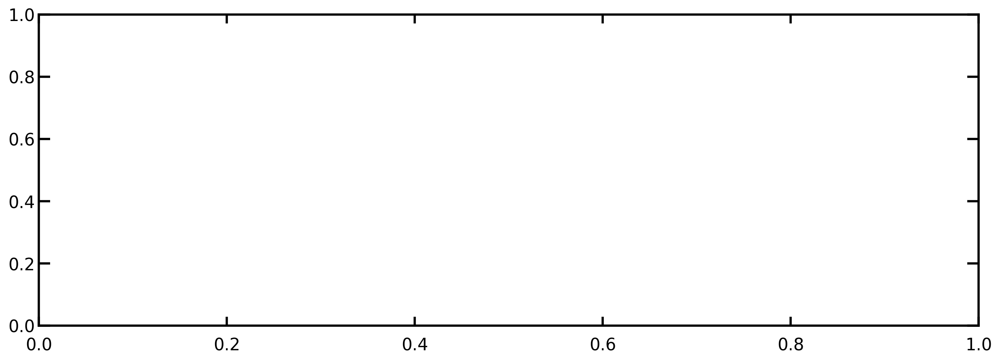

In [ ]:
##for 6th fold performance
import numpy as np
import matplotlib.pyplot as plt
fig,ax1 = plt.subplots(1,1,figsize=(15,5),sharey=True)
mean_smote=[tss_mean_svm[4],tss_mean_lda[4],tss_mean_xgboost[4],tss_mean_rf[4],tss_mean_dt[4],tss_mean_lr[4],tss_mean_gb[4],tss_mean_adaboost[4]]
std_smote=[tss_std_svm[4],tss_std_lda[4],tss_std_xgboost[4],tss_std_rf[4],tss_std_dt[4],tss_std_lr[4],tss_std_gb[4],tss_std_adaboost[4]]
method1=['svm1','LDA','XGboost','RF','DT','LR','GB','Adaboost']
x_pos = np.arange(0,len(method1))
y_pos=np.arange(0,1,0.2)
ax1.errorbar(x_pos, mean_smote, yerr=std_smote,marker='o', markersize=8,
            linestyle='none',color='black',capthick=0.2)
#ax3.set_ylabel('True skill score')
ax1.set_ylim(0,1)
ax1.set_xticks(x_pos)
method1=['svm1','LDA','XGboost','RF','DT','LR','GB','Adaboost']
ax1.tick_params(axis='both', labelsize=15)
ax1.set_xticklabels(method1,rotation=20)
#ax1.set_yticklabels(fontsize=10)
ax1.set_title('TSS_SMOTE')
ax1.set_ylabel('TSS_score',fontsize=15)
ax1.yaxis.grid(True)
plt.savefig('/content/drive/MyDrive/Colab Notebooks/CME_flares/file4.pdf',bbox_inches='tight')
plt.savefig('/content/drive/MyDrive/Colab Notebooks/CME_flares/file4.png',dpi=300,bbox_inches='tight')
plt.close()


##plotting/visualizations

In [ ]:
import matplotlib as pl
import matplotlib.pyplot as plt

pl.rcParams['figure.figsize'] = 6, 5
pl.rcParams['ytick.minor.visible'] =False
pl.rcParams['xtick.minor.visible'] = False
pl.rcParams['xtick.top'] = True
pl.rcParams['ytick.right'] = True
pl.rcParams['font.size'] = '20'
pl.rcParams['legend.fontsize'] = '10'
pl.rcParams['legend.borderaxespad'] = '1.9'
#pl.rcParams['legend.numpoints'] = '1'

pl.rcParams['figure.titlesize'] = 'medium'
pl.rcParams['figure.titlesize'] = 'medium'
pl.rcParams['xtick.major.size'] = '8'
pl.rcParams['xtick.minor.size'] = '5'
pl.rcParams['xtick.major.width'] = '2'
pl.rcParams['xtick.minor.width'] = '1'
pl.rcParams['ytick.major.size'] = '10'
pl.rcParams['ytick.minor.size'] = '6'
pl.rcParams['ytick.major.width'] = '2'
pl.rcParams['ytick.minor.width'] = '1'
pl.rcParams['xtick.direction'] = 'in'
pl.rcParams['ytick.direction'] = 'in'
pl.rcParams['axes.labelpad'] = '10.0'
pl.rcParams['lines.dashed_pattern']=3.0, 1.4
#pl.rcParams['axes.formatter.limits']=-10,10
pl.rcParams['lines.dotted_pattern']= 1.0, 0.7

pl.rcParams['xtick.labelsize'] = '15'
pl.rcParams['ytick.labelsize'] = '15'
pl.rcParams['axes.labelsize'] = '15'
pl.rcParams['axes.labelsize'] = '15'

pl.rcParams['xtick.major.pad']='10'
pl.rcParams['xtick.minor.pad']='10'
#pl.rcParams['hatch.color'] = 'black'
pl.rc('axes', linewidth=2)

#pl.rcParams['text.usetex'] = True
#pl.rcParams['text.latex.unicode'] = True
#pl.rcParams['font.family'] = 'serif'
#pl.rcParams['font.serif']='Times New Roman'


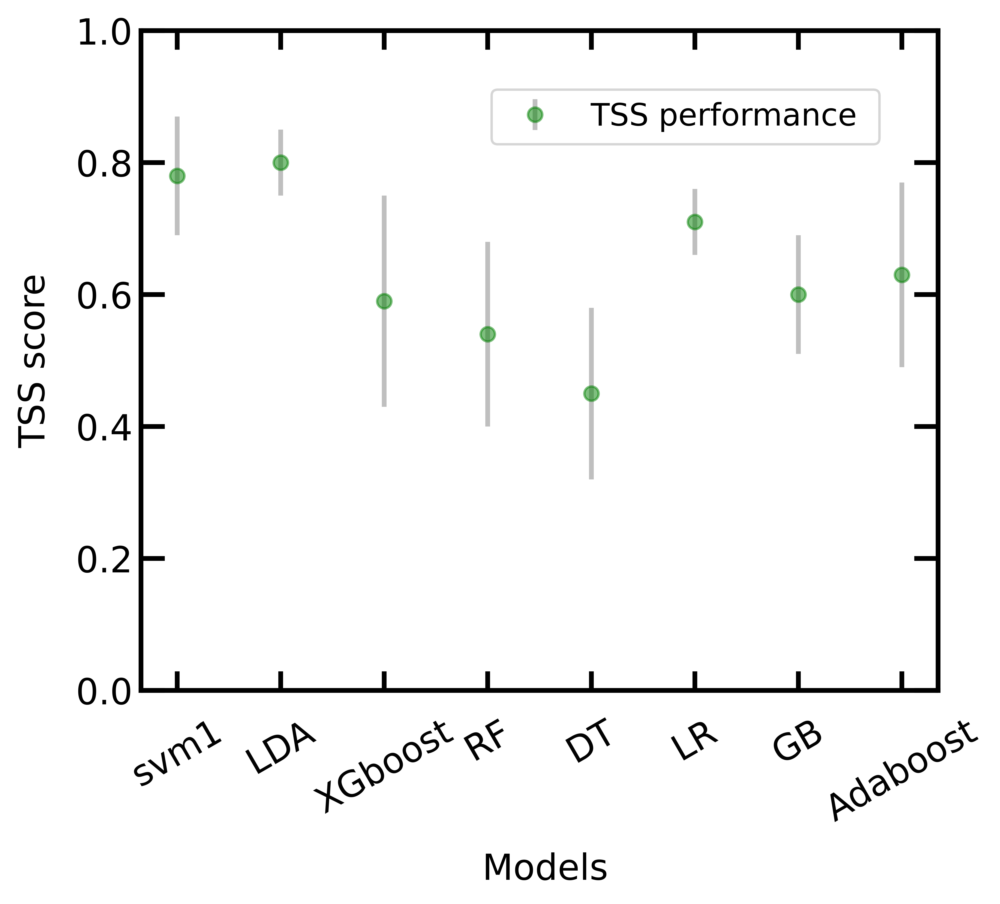

In [ ]:
#boxplot
#boxplot neighbourhood_group and room availability

y_mean_models=[0.78 ,0.8, 0.59, 0.54, 0.45, 0.71, 0.6 ,0.63]
y_std_models=[0.09, 0.05, 0.16 ,0.14 ,0.13, 0.05, 0.09 ,0.14]
y_mean_wc_models=[0.61,0.92,0.48,0.25,0.51,0.79,0.7,0.49]
y_std_wc_models=[0.08,0.04,0.05,0.1,0.24,0.11,0.12,0.12]


##plot data certainty along with model uncertainty
method1=['svm1','LDA','XGboost','RF','DT','LR','GB','Adaboost']
x_pos = np.arange(0,len(method1))
plt.figure(figsize=(6,5),dpi=400)
y_pos=np.arange(0,1.2,0.2)
#plt.plot(x_pos, mean_tss_10, 'o')
plt.errorbar(x_pos, y_mean_models, yerr=y_std_models, fmt='o', color='green',
             ecolor='gray',alpha=0.5, elinewidth=2,label='TSS performance ')
#plt.errorbar(x_pos+0.1, y_mean_wc_models, yerr=y_std_wc_models, fmt='o', color='red',
 #            ecolor='red',markerfacecolor=(1, 1, 0, 0.5), elinewidth=4,label='TSS performance With Change info')
plt.xticks(x_pos,method1,rotation=30,fontsize=15)
plt.xlabel ( " Models")
plt.ylabel("TSS score")
plt.yticks(y_pos)
plt.ylim(0,1)
plt.legend(fontsize=13)
plt.show()
plt.savefig('/content/drive/MyDrive/Colab Notebooks/CME_flares/file1.pdf',bbox_inches='tight')
plt.savefig('/content/drive/MyDrive/Colab Notebooks/CME_flares/file1.png',dpi=300,bbox_inches='tight')
plt.close()

w/o,class,imbalance:
[0.52,0.78,0.37,0.36,0.42,0.7,0.62,0.4,],[0.15,0.09,0.09,0.12,0.08,0.06,0.08,0.07],

RUS
[0.23,0.42,0.31,0.2,0.29,0.39,0.26,0.23],[0.12,0.15,0.12,0.11,0.14,0.1,0.14,0.16]
[0.28,0.49,0.25,0.2,0.23,0.43,0.15,0.22],[0.15,0.1,0.13,0.08,0.23,0.11,0.14,0.16]
0.43,0.5,0.34,0.29,0.19,0.42,0.27,0.28],[0.09,0.1,0.15,0.07,0.05,0.15,0.1,0.13]
[0.56,0.81,0.51,0.42,0.29,0.76,0.42,0.45],[0.17,0.06,0.09,0.12,0.17,0.1,0.04,0.05]

[0.41,0.55,0.41,0.34,0.35,0.5,0.42,0.41],[0.07,0.11,0.12,0.1,0.19,0.12,0.11,0.04]

ROS

[0.41,0.45,0.3,0.24,0.21,0.47,0.23,0.25],[0.09,0.13,0.18,0.1,0.15,0.13,0.15,0.12]

[0.48,0.58,0.4,0.33,0.2,0.56,0.38,0.29],[0.16,0.12,0.1,0.07,0.07,0.15,0.07,0.06]

[0.62,0.49,0.41,0.36,0.37,0.48,0.41,0.37],[0.18,0.12,0.12,0.19,0.22,0.12,0.1,0.15]

[0.73,0.79,0.44,0.4,0.48,0.8,0.46,0.36],[0.13,0.06,0.15,0.1,0.11,0.07,0.13,0.06]

[0.75,0.6,0.51,0.5,0.35,0.61,0.48,0.46],[0.12,0.15,0.06,0.12,0.08,0.12,0.08,0.07]

SMOTE
[0.35,0.44,0.33,0.25,0.34,0.42,0.23,0.11],[0.1,0.12,0.15,0.21,0.11,0.12,0.18,0.12]

[0.52,0.52,0.3,0.31,0.2,0.5,0.3,0.24],
[0.1,0.1,0.09,0.12,0.17,0.15,0.13,0.06]

[0.57,0.51,0.46,0.37,0.3,0.47,0.42,0.38],[0.08,0.15,0.16,0.17,0.23,0.15,0.16,0.15]

[0.77,0.76,0.57,0.53,0.39,0.77,0.56,0.54],[0.07,0.12,0.12,0.2,0.08,0.09,0.18,0.13]

[0.68,0.52,0.55,0.49,0.55,0.55,0.53,0.48],[0.05,0.13,0.17,0.11,0.14,0.12,0.12,0.1,]



In [ ]:
##plotting for different hour timelag for different sampling methods

wo_class_imbalance_36h_m= [0.52,0.78,0.37,0.36,0.42,0.7,0.62,0.4,]
wo_class_imbalance_36h_std=[0.15,0.09,0.09,0.12,0.08,0.06,0.08,0.07]

#3RRUS
rus_mean_8h=[0.23,0.42,0.31,0.2,0.29,0.39,0.26,0.23]
rus_std_8h=[0.12,0.15,0.12,0.11,0.14,0.1,0.14,0.16]
rus_mean_12h=[0.28,0.49,0.25,0.2,0.23,0.43,0.15,0.22]
rus_std_12h=[0.15,0.1,0.13,0.08,0.23,0.11,0.14,0.16]
rus_mean_24h=[0.43,0.5,0.34,0.29,0.19,0.42,0.27,0.28]
rus_std_24h= [0.09,0.1,0.15,0.07,0.05,0.15,0.1,0.13]
rus_mean_36h=[0.56,0.81,0.51,0.42,0.29,0.76,0.42,0.45]
rus_std_36h=[0.17,0.06,0.09,0.12,0.17,0.1,0.04,0.05]
rus_mean_48h=[0.41,0.55,0.41,0.34,0.35,0.5,0.42,0.41]
rus_std_48h=[0.07,0.11,0.12,0.1,0.19,0.12,0.11,0.04]

 ##ROS

ros_mean_8h=[0.41,0.45,0.3,0.24,0.21,0.47,0.23,0.25]
ros_std_8h=[0.09,0.13,0.18,0.1,0.15,0.13,0.15,0.12]

ros_mean_12h=[0.48,0.58,0.4,0.33,0.2,0.56,0.38,0.29]
ros_std_12h=[0.16,0.12,0.1,0.07,0.07,0.15,0.07,0.06]

ros_mean_24h=[0.62,0.49,0.41,0.36,0.37,0.48,0.41,0.37]
ros_std_24h=[0.18,0.12,0.12,0.19,0.22,0.12,0.1,0.15]

ros_mean_36h=[0.73,0.79,0.44,0.4,0.48,0.8,0.46,0.36]
ros_std_36h=[0.13,0.06,0.15,0.1,0.11,0.07,0.13,0.06]

ros_mean_48h=[0.75,0.6,0.51,0.5,0.35,0.61,0.48,0.46]
ros_std_48h=[0.12,0.15,0.06,0.12,0.08,0.12,0.08,0.07]

##SMOTE

sm_mean_8h=[0.35,0.44,0.33,0.25,0.34,0.42,0.23,0.11]
sm_std_8h=[0.1,0.12,0.15,0.21,0.11,0.12,0.18,0.12]

sm_mean_12h=[0.52,0.52,0.3,0.31,0.2,0.5,0.3,0.24]
sm_std_12h=[0.1,0.1,0.09,0.12,0.17,0.15,0.13,0.06]

sm_mean_24h=[0.57,0.51,0.46,0.37,0.3,0.47,0.42,0.38]
sm_std_24h=[0.08,0.15,0.16,0.17,0.23,0.15,0.16,0.15]

sm_mean_36h=[0.78,0.8,0.59,0.54,0.45,0.71,0.6,0.63]
sm_std_36h=[0.09,0.05,0.16,0.14,0.13,0.05,0.09,0.14]

sm_mean_48h=[0.68,0.52,0.55,0.49,0.55,0.55,0.53,0.48]
sm_std_48h=[0.05,0.13,0.17,0.11,0.14,0.12,0.12,0.1,]



In [ ]:
sm_svm_m=[0.35,0.52,0.57,0.78,0.68]
sm_lda_m=[0.44,0.52,0.51,0.8,0.52]
sm_xg_m=[0.33,0.3,0.46,0.59,0.55]
sm_rf_m=[0.25,0.31,0.37,0.54,0.49]
sm_dt_m=[0.34,0.2,0.3,0.45,0.55]
sm_lr_m=[0.42,0.5,0.47,0.71,0.55]
sm_ab_m=[0.23,0.3,0.42,0.6,0.53]
sm_gb_m=[0.11,0.24,0.38,0.63,0.48]

sm_svm_std=[0.1,0.1,0.08,0.09,0.05]
sm_lda_std=[0.12,0.1,0.15,0.05,0.13]
sm_xg_std=[0.15,0.09,0.16,0.16,0.17]
sm_rf_std=[0.21,0.12,0.17,0.14,0.11]
sm_dt_std=[0.11,0.17,0.23,0.13,0.14]
sm_lr_std=[0.12,0.15,0.15,0.05,0.12]
sm_ab_std=[0.18,0.13,0.16,0.09,0.12]
sm_gb_std=[0.12,0.06,0.15,0.14,0.1]

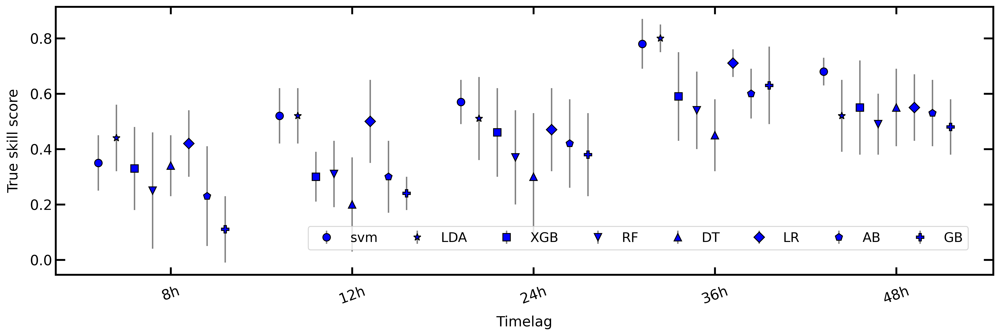

In [ ]:

##plot
import numpy as np
import matplotlib.pyplot as plt
Method=['svm','LDA','XGboost','RF','DT','LR','Adaboost','GB']
time_delay=['8h','12h','24h','36h','48h',]
x_pos_svm=np.arange(0,len(time_delay))
x_pos_lda=np.arange(0.1,len(time_delay)+0.1)
x_pos_xgboost=np.arange(0.2,len(time_delay)+0.2)
x_pos_RF=np.arange(0.3,len(time_delay)+0.3)
x_pos_DT=np.arange(0.4,len(time_delay)+0.4)
x_pos_LR=np.arange(0.5,len(time_delay)+0.5)
x_pos_ab=np.arange(0.6,len(time_delay)+0.6)
x_pos_gb=np.arange(0.7,len(time_delay)+0.7)
y_pos=np.arange(0,1,0.2)
fig,ax1 = plt.subplots(1,1,figsize=(15,5),dpi=200,sharey=True)
fig.tight_layout()
#ax1.bar(x_pos, mean_wo, yerr=std_wo, align='center', alpha=0.5, ecolor='black', capsize=10)
ax1.errorbar(x_pos_svm, sm_svm_m, yerr=sm_svm_std,marker='o', markersize=8,markeredgecolor='black',ecolor='gray',
            linestyle='none',color='blue',label='svm')
ax1.errorbar(x_pos_lda, sm_lda_m, yerr=sm_lda_std,marker='*', markersize=8,markeredgecolor='black',ecolor='gray',
            linestyle='none',color='blue',label='LDA')
ax1.errorbar(x_pos_xgboost, sm_xg_m, yerr=sm_xg_std,marker='s', markersize=8,markeredgecolor='black',ecolor='gray',
            linestyle='none',color='blue',label='XGB')
ax1.errorbar(x_pos_RF, sm_rf_m, yerr=sm_rf_std,marker='v', markersize=8,markeredgecolor='black',ecolor='gray',
            linestyle='none',color='blue',label='RF')
ax1.errorbar(x_pos_DT, sm_dt_m, yerr=sm_dt_std,marker='^', markersize=8,markeredgecolor='black',ecolor='gray',
            linestyle='none',color='blue',label='DT')
ax1.errorbar(x_pos_LR, sm_lr_m, yerr=sm_lr_std,marker='D', markersize=8,markeredgecolor='black',ecolor='gray',
            linestyle='none',color='blue',label='LR')
ax1.errorbar(x_pos_ab, sm_ab_m, yerr=sm_ab_std,marker='p', markersize=8,markeredgecolor='black',ecolor='gray',
            linestyle='none',color='blue',label='AB')
ax1.errorbar(x_pos_gb, sm_gb_m, yerr=sm_gb_std,marker='P', markersize=8,markeredgecolor='black',ecolor='gray',
            linestyle='none',color='blue',label='GB')

ax1.set_ylabel('True skill score',fontsize=15)
ax1.tick_params(axis='both',labelsize=15)
ax1.set_xticks(x_pos_DT)
ax1.set_xticklabels(time_delay,rotation=20,fontsize=15)
#ax1.set_title('RUS',fontsize=14)
#ax1.yaxis.grid(True)
#ax2.bar(x_pos, mean_rus, yerr=std_rus, align='center', alpha=0.5, ecolor='black', capsize=10)
ax1.set_xlabel('Timelag',fontsize=15)
#ax3.legend(bbox_to_anchor=(1.05, 1.0),loc='upper left',fontsize=14,ncol=len(Method))
plt.legend(fontsize=14,loc='lower right',ncol=len(Method))
plt.savefig('/content/drive/MyDrive/Colab Notebooks/CME_flares/file2.pdf',bbox_inches='tight')
plt.savefig('/content/drive/MyDrive/Colab Notebooks/CME_flares/file2.png',dpi=300,bbox_inches='tight')

# Save the figure and show

plt.show()
plt.close()

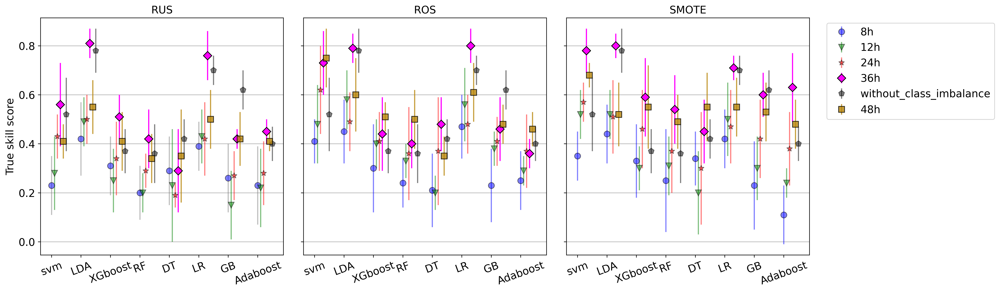

In [ ]:
##plot
import numpy as np
import matplotlib.pyplot as plt
Method=['svm','LDA','XGboost','RF','DT','LR','GB','Adaboost']
x_pos_8 = np.arange(0,len(Method))
x_pos_12=np.arange(0.1,len(Method)+0.1)
x_pos_24=np.arange(0.2,len(Method)+0.2)
x_pos_36=np.arange(0.3,len(Method)+0.3)
x_pos_wc=np.arange(0.5,len(Method)+0.5)
x_pos_48=np.arange(0.4,len(Method)+0.4)

# Build the plot
#fig = plt.figure()

fig,(ax1, ax2,ax3) = plt.subplots(1,3,figsize=(15,5),dpi=200,sharey=True)
fig.tight_layout()
#ax1.bar(x_pos, mean_wo, yerr=std_wo, align='center', alpha=0.5, ecolor='black', capsize=10)
ax1.errorbar(x_pos_8, rus_mean_8h, yerr=rus_std_8h,marker='o', markersize=8,markeredgecolor='black',ecolor='gray',
            linestyle='none',color='blue',alpha=0.5,label='8h')
ax1.errorbar(x_pos_12, rus_mean_12h, yerr=rus_std_12h,marker='v', markersize=8,markeredgecolor='black',
            linestyle='none',color='green',alpha=0.5,label='12h')
ax1.errorbar(x_pos_24, rus_mean_24h, yerr=rus_std_24h,marker='*', markersize=8,markeredgecolor='black',
            linestyle='none',color='red',alpha=0.5,label='24h')
ax1.errorbar(x_pos_36, rus_mean_36h, yerr=rus_std_36h,marker='D', markersize=8,markeredgecolor='black',
            linestyle='none',color='magenta',label='36h')
ax1.errorbar(x_pos_wc, wo_class_imbalance_36h_m, yerr=wo_class_imbalance_36h_std,marker='p', markersize=8,markeredgecolor='black',
            linestyle='none',color='black',alpha=0.5,label='wo_CI')
ax1.errorbar(x_pos_48, rus_mean_48h, yerr=rus_std_48h,marker='s', markersize=8,markeredgecolor='black',
            linestyle='none',color='darkgoldenrod',label='48h',alpha=0.8)
ax1.set_ylabel('True skill score',fontsize=14)
ax1.tick_params(axis='both',labelsize=14)
ax1.set_xticks(x_pos_8)
ax1.set_xticklabels(Method,rotation=20,fontsize=14)
ax1.set_title('RUS',fontsize=14)
ax1.yaxis.grid(True)
#ax2.bar(x_pos, mean_rus, yerr=std_rus, align='center', alpha=0.5, ecolor='black', capsize=10)

ax2.errorbar(x_pos_8, ros_mean_8h, yerr=ros_std_8h,marker='o', markersize=8,markeredgecolor='black',
            linestyle='none',color='blue',alpha=0.5,label='8h')
ax2.errorbar(x_pos_12, ros_mean_12h, yerr=ros_std_12h,marker='v', markersize=8,markeredgecolor='black',
            linestyle='none',color='green',alpha=0.5,label='12h')
ax2.errorbar(x_pos_24, ros_mean_24h, yerr=ros_std_24h,marker='*', markersize=8,markeredgecolor='black',
            linestyle='none',color='red',alpha=0.5,label='24h')
ax2.errorbar(x_pos_36, ros_mean_36h, yerr=ros_std_36h,marker='D', markersize=8,markeredgecolor='black',
            linestyle='none',color='magenta',label='36h')
ax2.errorbar(x_pos_wc, wo_class_imbalance_36h_m, yerr=wo_class_imbalance_36h_std,marker='p', markersize=8,markeredgecolor='black',
            linestyle='none',color='black',alpha=0.5,label='wo_CI')
ax2.errorbar(x_pos_48, ros_mean_48h, yerr=ros_std_48h,marker='s', markersize=8,markeredgecolor='black',
            linestyle='none',color='darkgoldenrod',alpha=0.8,label='48h')
ax2.tick_params(axis='both',labelsize=14)
ax2.set_xticks(x_pos_8)
ax2.set_xticklabels(Method,rotation=20,fontsize=14)
ax2.set_title('ROS',fontsize=14)
ax2.yaxis.grid(True)
#ax2.legend(bbox_to_anchor=(2, 1.05))

#ax3.bar(x_pos, mean_ros, yerr=std_ros, align='center', alpha=0.5, ecolor='black', capsize=10)
ax3.errorbar(x_pos_8, sm_mean_8h, yerr=sm_std_8h,marker='o', markersize=8,markeredgecolor='black',
            linestyle='none',color='blue',alpha=0.5,label='8h')
ax3.errorbar(x_pos_12, sm_mean_12h, yerr=sm_std_12h,marker='v', markersize=8,markeredgecolor='black',
            linestyle='none',color='green',alpha=0.5,label='12h')
ax3.errorbar(x_pos_24, sm_mean_24h, yerr=sm_std_24h,marker='*', markersize=8,markeredgecolor='black',
            linestyle='none',color='red',alpha=0.5,label='24h')
ax3.errorbar(x_pos_36, sm_mean_36h, yerr=sm_std_36h,marker='D', markersize=8,markeredgecolor='black',
            linestyle='none',color='magenta',label='36h')
ax3.errorbar(x_pos_wc, wo_class_imbalance_36h_m, yerr=wo_class_imbalance_36h_std,marker='p', markersize=8,markeredgecolor='black',
            linestyle='none',color='black',alpha=0.5,label='without_class_imbalance')
ax3.errorbar(x_pos_48, sm_mean_48h, yerr=sm_std_48h,marker='s', markersize=8,markeredgecolor='black',
            linestyle='none',color='darkgoldenrod',alpha=0.8,label='48h')
#ax3.set_ylabel('True skill score')
ax3.tick_params(axis='both',labelsize=14)
ax3.set_xticks(x_pos_8)
ax3.set_xticklabels(Method,rotation=20,fontsize=14)
ax3.set_title('SMOTE',fontsize=14)
ax3.yaxis.grid(True)
ax3.legend(bbox_to_anchor=(1.05, 1.0),loc='upper left',fontsize=14)

#plt.legend(fontsize=12)

# Save the figure and show

plt.show()

##wrapper

In [ ]:
    ##wrapper with inbuilt wrapper kfold
    import joblib
    import sys
    sys.modules['sklearn.externals.joblib'] = joblib
    from mlxtend.feature_selection import SequentialFeatureSelector as SFS
    from sklearn.metrics import make_scorer
    from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs
    import matplotlib.pyplot as plt
    def training_sampling_wrapper(positive_cl,negative_cl,n):
      svm1 = svm.SVC(C=4, gamma=0.075, kernel='rbf', class_weight={1: 6.5}, cache_size=500, max_iter=-1, shrinking=True, tol=1e-8, probability=True)
      clf = SVC(C=4.0, gamma=0.0088,probability=True, kernel='rbf',class_weight={1:6.5}, cache_size=500, max_iter=-1, shrinking=True, tol=1e-8)
      from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
      LDA = LinearDiscriminantAnalysis()
      if n==0:
        CME_data,no_CME_data,xdata,ydata=data_gen(positive_cl,negative_cl)   ##change according to with/without change information
        method=[LDA,svm1]
        k_features=(3,18)
        custom_feature_names=col
      else:
        CME_data,no_CME_data,xdata,ydata=data_gen_change(positive_cl,negative_cl)
        method=[LDA,clf]
        k_features=(3,30)
        custom_feature_names=col1
      these_TSS_for_this_k=[]
      method1=['LDA','svm1']
      svm_per=[]
      LDA_per=[]
      method_per=[LDA_per,svm_per]
      xtrain1, ytrain1=SMOTE_test(xdata,ydata)
      for i in range(0,2):
        print("#wrapper explanations for" ,"method=",method1[i])
        #method[i].fit(xtrain1, ytrain1)
        #y_pred=method[i].predict(xtest)
        sfs36= SFS(method[i], k_features=k_features,forward=True, floating=True, verbose=2,cv=5,scoring=tss_scorer)
        sfs36.fit(xtrain1, ytrain1,custom_feature_names=custom_feature_names)
            #sfs36.k_feature_names_
        sfs36.subsets_
        method_per[i].append(np.array(pd.DataFrame.from_dict(sfs36.get_metric_dict()).T ))
      return method_per



In [ ]:
method_per=training_sampling_wrapper(positive_class_36,negative_class_36,0)
#method_per=training_sampling_wrapper(data_p24_new,data_n24_new,1)

#wrapper explanations for method= LDA


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  18 out of  18 | elapsed:    0.3s finished

[2023-01-16 11:37:32] Features: 1/18 -- score: 0.09944444444444445[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  17 out of  17 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished

[2023-01-16 11:37:32] Features: 2/18 -- score: 0.2825925925925926[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_j

#wrapper explanations for method= svm1


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   35.9s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  18 out of  18 | elapsed: 12.1min finished

[2023-01-16 11:49:56] Features: 1/18 -- score: 0.014907407407407414[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.3s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  17 out of  17 | elapsed:   30.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    7.5s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    7.5s finished

[2023-01-16 11:50:34] Features: 2/18 -- score: 0.044629629629629644[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.7s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  16 out of  16 | elapsed:   13.5s finished
[Parallel(n_jobs=1)]:

In [ ]:
np.array(method_per[0])[:,2,3]

array([('diff_TOTUSJH,', 'diff_MEANGAM,', 'diff_TOTUSJZ,')], dtype=object)

In [ ]:
feature_lda=[]
feature_svm=[]
for i in range(0,18):
  feature_lda.append(np.array(method_per[0])[:,i,3])
  feature_svm.append(np.array(method_per[1])[:,i,3])


In [ ]:
score_m_lda=[]
score_m_svm=[]
for i in range(0,18):
  score_m_lda.append(np.array(method_per[0])[:,i,2])
  score_m_svm.append(np.array(method_per[1])[:,i,2])


In [ ]:
score_std_lda=[]
score_std_svm=[]
for i in range(0,18):
  score_std_lda.append(np.array(method_per[0])[:,i,5])
  score_std_svm.append(np.array(method_per[1])[:,i,5])

In [ ]:
#score_lda=np.array(score_lda).reshape(4,15)
#score_svm=np.array(score_svm).reshape(4,15)
mean_lda_score=[]
std_lda_score=[]
mean_svm_score=[]
std_svm_score=[]
for i in range(0,30):
  mean_lda_score.append(np.mean(np.mean(np.array(score_lda[i]))))##mean into mean is working, only mean returns an entire array
  std_lda_score.append(np.std(np.mean(np.array(score_lda[i]))))
  mean_svm_score.append(np.mean(np.mean(np.array(score_svm[i]))))
  std_svm_score.append(np.std(np.mean(np.array(score_svm[i]))))

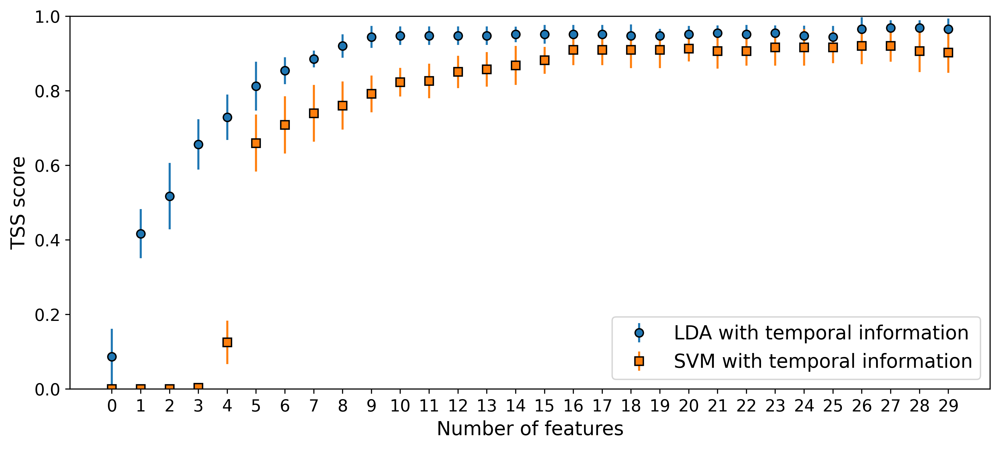

In [ ]:
x=np.arange(0,30,1)
plt.figure(figsize=(12,5),dpi=200)
plt.errorbar(x, np.array(mean_lda_score), yerr=np.array(std_lda_score), label='LDA with temporal information',marker='o',markeredgecolor='black',linestyle='none')
plt.errorbar(x, np.array(mean_svm_score), yerr=np.array(std_svm_score), label='SVM with temporal information',marker='s',markeredgecolor='black',linestyle='none')
plt.xticks(x,fontsize=12)
plt.yticks(fontsize=12)
plt.ylim(0,1)
plt.xlabel('Number of features',fontsize=14)
plt.ylabel('TSS score',fontsize=14)
plt.legend(fontsize=14,loc='best')

##DALEX

In [ ]:
!pip install dalex

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 12.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for dalex: filename=dalex-1.5.0-py3-none-any.whl size=1043321 sha256=fa90eb476e1486602b3d201cb5613c0ce6a1e90bb436d1b30fb518d586a257e6
  Stored in directory: /root/.cache/pip/wheels/b1/02/58/77ac4cb307fec9f3324c6aa4f9f23a7b0e886e313ebc280257
Successfully built dalex


In [ ]:
##defining function to chose index of true positive, fp, fn, tn
%%
"""
def confusion_table_index(pred, labels):
    """
    computes the number of TP, TN, FP, FN events given the arrays with predictions and true labels
    and returns the true skill score

    Args:
    pred: np array with predictions (1 for flare, 0 for nonflare)
    labels: np array with true labels (1 for flare, 0 for nonflare)

    Returns: true negative, false positive, true positive, false negative
    """
    Nobs = len(pred)
    TN_i=[]
    TP_i =[]
    FP_i = []
    FN_i = []
    for i in range(Nobs):
        if (pred[i] == 0 and labels[i] == 0):
            TN_i.append(i)
        elif (pred[i] == 1 and labels[i] == 0):
            FP_i.append(i)
        elif (pred[i] == 1 and labels[i] == 1):
            TP_i.append(i)
        elif (pred[i] == 0 and labels[i] == 1):
            FN_i.append(i)
        else:
            print("Error! Observation could not be classified.")
    return TN_i, FP_i, TP_i, FN_i
    ##without change information
    ##explanation for model prediction
    svm_cw,svm1,clf,LDA,XGboost,RF,DT,LR,Adaboost,GB=model_list_wo_hyper()
    import dalex as dx
    def explanation_models_default(positive_cl,negative_cl,kfolds,sampling,n):
      svm1 = svm.SVC(C=4, gamma=0.075, kernel='rbf', class_weight={1: 6.5}, cache_size=500, max_iter=-1, shrinking=True, tol=1e-8, probability=True)
      clf = SVC(C=4.0, gamma=0.0088,probability=True, kernel='rbf',class_weight={1:6.5}, cache_size=500, max_iter=-1, shrinking=True, tol=1e-8)
      from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
      LDA = LinearDiscriminantAnalysis()
      if n==0:
        CME_data,no_CME_data,xdata,ydata=data_gen(positive_cl,negative_cl)   ##change according to with/without change information
        method=[LDA,svm1]
        method1=['LDA','SVM']
        columns=col
      else:
        CME_data,no_CME_data,xdata,ydata=data_gen_change(positive_cl,negative_cl)
        method=[LDA,clf]
        method1=['LDA','SVM']
        columns=col1
      skf = StratifiedKFold(n_splits=kfolds, shuffle=True)
      LDA_loss=[]
      LDA_index=[]
      SVM_loss=[]
      SVM_index=[]
      these_TSS_for_this_k=[]
      fold=0
      for train_index, test_index in skf.split(xdata, ydata):
          # xtrain are the examples in the training set
          xtrain2 = xdata[train_index]
          # ytrain are the labels in the training set
          ytrain2 = ydata[train_index]
          # xtest are the examples in the testing set
          xtest = xdata[test_index]
          ytest = ydata[test_index]    # ytest are the labels in the testing set

          #sampling training dataset
          xtrain1,ytrain1=sampling(xtrain2,ytrain2)
          xtrain1=pd.DataFrame(xtrain1,columns=columns)###change for change information
          xtest=pd.DataFrame(xtest,columns=columns)###change for change information
          fold+=1
          for i in range(0,2):
            print("#model-level explanations for Foldnumber=",fold,"method=",method1[i])
            method[i].fit(xtrain1, ytrain1)
            y_pred=method[i].predict(xtest)
            TN, FP, TP, FN = confusion_table(y_pred, ytest)
            if (((TP+FN) == 0.0) or (FP+TN) == 0.0) or(FP+TP)==0.0:
                these_TSS_for_this_k.append(np.nan)
                continue
            else:
                these_TSS_for_this_k.append(TP/(TP+FN) - FP/(FP+TN))
            #TP0,FP0,TN0,FN0=index_table(y_pred,ytest)
            # custom (binary) predict function
            #pf_1 = lambda m, d: m.predict_proba(d)[:, 1]  #change class of prediction
            # custom (binary) target values
            #y_0 = ytrain1 == 1 #change class of prediction
            TN_i, FP_i, TP_i, FN_i=confusion_table_index(y_pred,ytest)
            ar=[TN_i, FP_i, TP_i, FN_i]
            for k in [TN_i, FP_i, TP_i, FN_i]:
              dx_exp = dx.Explainer(method[i],pd.DataFrame(xtest).iloc[k],pd.DataFrame(ytest).iloc[k], label = "prediction explanation")
              exp=dx_exp.model_parts()
              if i==0:
                LDA_loss.append(exp.result.dropout_loss)
                LDA_index.append(exp.result.variable)
              else:
                SVM_loss.append(exp.result.dropout_loss)
                SVM_index.append(exp.result.variable)
            ##dx_exp.model_parts().plot()
            #dx_exp.predict_parts(xtest).plot() ##variable contribution to single prediction
            ##dx_exp.model_profile().plot()
            ##grouped = dx_exp.model_parts(
              ##  variable_groups={'Magnetic free energy': ['MEANPOT', 'TOTPOT'],
                ##                 'Shear angle':['MEANSHR', 'SHRGT45'],
                  ##               'current Helicity':['MEANJZH','TOTUSJH','ABSNJZH'],
                    ##             'twist parameter':['MEANALP',],
                      ##           'Bfield gradient':['MEANGBH','MEANGBT','MEANGBZ'],
                        ##         'Distribution of Bfield':['USFLUX','AREA_ACR','R_VALUE'],
                          ##       'current density':['MEANJZD','TOTUSJZ','SAVNCPP']})  ##model_parts- variable contribution to model performance
            ##grouped.plot()
      return (LDA_loss,LDA_index,SVM_loss,SVM_index,np.array(these_TSS_for_this_k).reshape(kfolds,2)
      3####%%%%%%########

In [ ]:
    ##without change information
    ##explanation for model prediction
    svm_cw,svm1,clf,LDA,XGboost,RF,DT,LR,Adaboost,GB=model_list_wo_hyper()
    import dalex as dx
    def explanation_models_default(positive_cl,negative_cl,kfolds,sampling,n,class_n):
      svm1 = svm.SVC(C=4, gamma=0.075, kernel='rbf', class_weight={1: 6.5}, cache_size=500, max_iter=-1, shrinking=True, tol=1e-8, probability=True)
      clf = SVC(C=4.0, gamma=0.0088,probability=True, kernel='rbf',class_weight={1:6.5}, cache_size=500, max_iter=-1, shrinking=True, tol=1e-8)
      from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
      LDA = LinearDiscriminantAnalysis()
      if n==0:
        CME_data,no_CME_data,xdata,ydata=data_gen(positive_cl,negative_cl)   ##change according to with/without change information
        method=[LDA,svm1]
        method1=['LDA','SVM']
        columns=col
      else:
        CME_data,no_CME_data,xdata,ydata=data_gen_change(positive_cl,negative_cl)
        method=[LDA,clf]
        method1=['LDA','SVM']
        columns=col1
      skf = StratifiedKFold(n_splits=kfolds, shuffle=True)
      LDA_loss=[]
      LDA_index=[]
      SVM_loss=[]
      SVM_index=[]
      these_TSS_for_this_k=[]
      fold=0
      for train_index, test_index in skf.split(xdata, ydata):
          # xtrain are the examples in the training set
          xtrain2 = xdata[train_index]
          # ytrain are the labels in the training set
          ytrain2 = ydata[train_index]
          # xtest are the examples in the testing set
          xtest = xdata[test_index]
          ytest = ydata[test_index]    # ytest are the labels in the testing set

          #sampling training dataset
          xtrain1,ytrain1=sampling(xtrain2,ytrain2)
          xtrain1=pd.DataFrame(xtrain1,columns=columns)###change for change information
          xtest=pd.DataFrame(xtest,columns=columns)###change for change information
          fold+=1
          for i in range(0,2):
            print("#model-level explanations for Foldnumber=",fold,"method=",method1[i])
            method[i].fit(xtrain1, ytrain1)
            y_pred=method[i].predict(xtest)
            TN, FP, TP, FN = confusion_table(y_pred, ytest)
            if (((TP+FN) == 0.0) or (FP+TN) == 0.0) or(FP+TP)==0.0:
                these_TSS_for_this_k.append(np.nan)
                continue
            else:
                these_TSS_for_this_k.append(TP/(TP+FN) - FP/(FP+TN))
            #TP0,FP0,TN0,FN0=index_table(y_pred,ytest)
            # custom (binary) predict function
            #pf_1 = lambda m, d: m.predict_proba(d)[:, 1]  #change class of prediction
            # custom (binary) target values
            #y_0 = ytrain1 == 1 #change class of prediction
            dx_exp = dx.Explainer(method[i],xtrain1,ytrain1, label = "prediction explanation")
            dx_exp.predict(xtrain1.iloc[np.where(ytrain1==class_n)])
            exp=dx_exp.model_parts()
            if i==0:
              LDA_loss.append(exp.result.dropout_loss)
              LDA_index.append(exp.result.variable)
            else:
              SVM_loss.append(exp.result.dropout_loss)
              SVM_index.append(exp.result.variable)
            ##dx_exp.model_parts().plot()
            #dx_exp.predict_parts(xtest).plot() ##variable contribution to single prediction
            ##dx_exp.model_profile().plot()
            ##grouped = dx_exp.model_parts(
              ##  variable_groups={'Magnetic free energy': ['MEANPOT', 'TOTPOT'],
                ##                 'Shear angle':['MEANSHR', 'SHRGT45'],
                  ##               'current Helicity':['MEANJZH','TOTUSJH','ABSNJZH'],
                    ##             'twist parameter':['MEANALP',],
                      ##           'Bfield gradient':['MEANGBH','MEANGBT','MEANGBZ'],
                        ##         'Distribution of Bfield':['USFLUX','AREA_ACR','R_VALUE'],
                          ##       'current density':['MEANJZD','TOTUSJZ','SAVNCPP']})  ##model_parts- variable contribution to model performance
            ##grouped.plot()
      return (LDA_loss,LDA_index,SVM_loss,SVM_index,np.array(these_TSS_for_this_k).reshape(kfolds,2))

In [ ]:
CME_data,no_CME_data,xdata,ydata=data_gen(positive_class_36,negative_class_36)
xdata=pd.DataFrame(xdata)
xdata.iloc[np.where(ydata==1)]

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
2,1.035870,-1.022645,0.409135,-0.945869,-1.371206,0.486994,-1.383990,0.561715,-1.574032,-0.735858,-1.293852,0.325384,0.294454,-0.064275,-1.570614,0.597860,-0.138512,0.224336
5,-0.684601,0.402128,0.036505,-0.072360,-0.162160,-0.492528,0.708805,0.025128,-0.252995,0.621728,-0.405731,-0.631995,-0.734395,-0.522179,-0.141922,-0.544281,0.340410,-0.703113
6,-0.870784,1.228468,0.299471,-0.640213,-0.408389,-0.597267,0.611587,0.427897,-0.105426,0.833291,-0.156641,-0.582478,-0.550567,-0.652784,-0.279038,-0.349960,-1.591710,-0.520384
12,0.335199,-1.472659,0.868826,-0.848821,-1.160288,0.300380,-1.047371,1.124686,-1.303837,-1.216544,-0.165244,0.123562,0.817579,-0.268958,-1.145413,-0.083778,0.018781,0.715705
15,0.021644,-0.828571,-0.256111,-0.546485,-0.922395,-0.189912,-0.955574,-0.310537,-1.195130,-0.740661,-1.509668,-0.316399,-0.374687,-0.285436,-1.047029,-0.188926,-0.279371,-0.434356
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
450,0.180885,1.055734,-1.937086,2.517450,0.937416,2.082879,1.897513,-1.784646,0.658286,1.818602,-1.687829,1.261968,2.396945,1.304426,0.953168,0.318569,1.504847,2.015616
451,2.116160,0.000000,0.433866,0.386424,0.673964,2.100796,0.149213,0.518567,0.644370,-0.182135,1.238811,2.550269,1.680851,2.120814,0.762054,3.007416,0.976624,0.874264
454,-0.418750,-0.528388,-0.138781,-1.499773,-1.912815,-0.756429,-1.708922,-0.244711,-2.157483,-0.870877,0.000000,-0.720935,-0.663675,-0.755964,-1.895593,-0.432977,-3.434619,-0.608984
456,-0.314985,-0.325019,0.701465,0.677850,1.306562,0.033433,0.647070,0.815242,1.218762,-0.206150,0.880618,0.167187,0.226003,0.177674,1.361830,-0.008508,0.361539,0.137530


In [ ]:

LDA_loss,LDA_index,SVM_loss,SVM_index,TSS=explanation_models_default(positive_class_36,negative_class_36,5,SMOTE_test,0,1)

#model-level explanations for Foldnumber= 1 method= LDA
Preparation of a new explainer is initiated

  -> data              : 644 rows 18 cols
  -> target variable   : 644 values
  -> model_class       : sklearn.discriminant_analysis.LinearDiscriminantAnalysis (default)
  -> label             : prediction explanation
  -> predict function  : <function yhat_proba_default at 0x7f6c6c60f040> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 1.94e-09, mean = 0.507, max = 1.0
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.987, mean = -0.00673, max = 0.989
  -> model_info        : package sklearn

A new explainer has been created!


/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but LinearDiscriminantAnalysis was fitted with feature names
  warnings.warn(


#model-level explanations for Foldnumber= 1 method= SVM
Preparation of a new explainer is initiated

  -> data              : 644 rows 18 cols
  -> target variable   : 644 values
  -> model_class       : sklearn.svm._classes.SVC (default)
  -> label             : prediction explanation
  -> predict function  : <function yhat_proba_default at 0x7f6c6c60f040> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 1e-07, mean = 0.496, max = 1.0
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.135, mean = 0.0038, max = 0.0166
  -> model_info        : package sklearn

A new explainer has been created!


/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


#model-level explanations for Foldnumber= 2 method= LDA
Preparation of a new explainer is initiated

  -> data              : 644 rows 18 cols
  -> target variable   : 644 values
  -> model_class       : sklearn.discriminant_analysis.LinearDiscriminantAnalysis (default)
  -> label             : prediction explanation
  -> predict function  : <function yhat_proba_default at 0x7f6c6c60f040> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 4e-09, mean = 0.508, max = 1.0
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.979, mean = -0.00758, max = 0.998
  -> model_info        : package sklearn

A new explainer has been created!


/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but LinearDiscriminantAnalysis was fitted with feature names
  warnings.warn(


#model-level explanations for Foldnumber= 2 method= SVM
Preparation of a new explainer is initiated

  -> data              : 644 rows 18 cols
  -> target variable   : 644 values
  -> model_class       : sklearn.svm._classes.SVC (default)
  -> label             : prediction explanation
  -> predict function  : <function yhat_proba_default at 0x7f6c6c60f040> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 1.46e-07, mean = 0.495, max = 1.0
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.295, mean = 0.00542, max = 0.0269
  -> model_info        : package sklearn

A new explainer has been created!


/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


#model-level explanations for Foldnumber= 3 method= LDA
Preparation of a new explainer is initiated

  -> data              : 644 rows 18 cols
  -> target variable   : 644 values
  -> model_class       : sklearn.discriminant_analysis.LinearDiscriminantAnalysis (default)
  -> label             : prediction explanation
  -> predict function  : <function yhat_proba_default at 0x7f6c6c60f040> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 9.35e-10, mean = 0.519, max = 1.0
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.947, mean = -0.0194, max = 0.882
  -> model_info        : package sklearn

A new explainer has been created!


/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but LinearDiscriminantAnalysis was fitted with feature names
  warnings.warn(


#model-level explanations for Foldnumber= 3 method= SVM
Preparation of a new explainer is initiated

  -> data              : 644 rows 18 cols
  -> target variable   : 644 values
  -> model_class       : sklearn.svm._classes.SVC (default)
  -> label             : prediction explanation
  -> predict function  : <function yhat_proba_default at 0x7f6c6c60f040> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 3.2e-07, mean = 0.497, max = 1.0
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.258, mean = 0.00293, max = 0.028
  -> model_info        : package sklearn

A new explainer has been created!


/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


#model-level explanations for Foldnumber= 4 method= LDA
Preparation of a new explainer is initiated

  -> data              : 646 rows 18 cols
  -> target variable   : 646 values
  -> model_class       : sklearn.discriminant_analysis.LinearDiscriminantAnalysis (default)
  -> label             : prediction explanation
  -> predict function  : <function yhat_proba_default at 0x7f6c6c60f040> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 8.54e-11, mean = 0.509, max = 1.0
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.994, mean = -0.00944, max = 0.99
  -> model_info        : package sklearn

A new explainer has been created!


/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but LinearDiscriminantAnalysis was fitted with feature names
  warnings.warn(


#model-level explanations for Foldnumber= 4 method= SVM
Preparation of a new explainer is initiated

  -> data              : 646 rows 18 cols
  -> target variable   : 646 values
  -> model_class       : sklearn.svm._classes.SVC (default)
  -> label             : prediction explanation
  -> predict function  : <function yhat_proba_default at 0x7f6c6c60f040> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 1e-07, mean = 0.499, max = 1.0
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.158, mean = 0.00148, max = 0.0175
  -> model_info        : package sklearn

A new explainer has been created!


/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


#model-level explanations for Foldnumber= 5 method= LDA
Preparation of a new explainer is initiated

  -> data              : 646 rows 18 cols
  -> target variable   : 646 values
  -> model_class       : sklearn.discriminant_analysis.LinearDiscriminantAnalysis (default)
  -> label             : prediction explanation
  -> predict function  : <function yhat_proba_default at 0x7f6c6c60f040> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 2.52e-10, mean = 0.515, max = 1.0
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.933, mean = -0.0147, max = 0.97
  -> model_info        : package sklearn

A new explainer has been created!


/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but LinearDiscriminantAnalysis was fitted with feature names
  warnings.warn(


#model-level explanations for Foldnumber= 5 method= SVM
Preparation of a new explainer is initiated

  -> data              : 646 rows 18 cols
  -> target variable   : 646 values
  -> model_class       : sklearn.svm._classes.SVC (default)
  -> label             : prediction explanation
  -> predict function  : <function yhat_proba_default at 0x7f6c6c60f040> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 7.11e-07, mean = 0.498, max = 1.0
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.538, mean = 0.00216, max = 0.0225
  -> model_info        : package sklearn

A new explainer has been created!


/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


In [ ]:
LDA_loss,LDA_index,SVM_loss,SVM_index,TSS=explanation_models_default(data_p24_new,data_n24_new,5,SMOTE_test,1,1)

#model-level explanations for Foldnumber= 1 method= LDA
Preparation of a new explainer is initiated

  -> data              : 590 rows 36 cols
  -> target variable   : 590 values
  -> model_class       : sklearn.discriminant_analysis.LinearDiscriminantAnalysis (default)
  -> label             : prediction explanation
  -> predict function  : <function yhat_proba_default at 0x7f6c6c60f040> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 1.71e-10, mean = 0.527, max = 1.0
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.998, mean = -0.0266, max = 0.815
  -> model_info        : package sklearn

A new explainer has been created!


/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but LinearDiscriminantAnalysis was fitted with feature names
  warnings.warn(


#model-level explanations for Foldnumber= 1 method= SVM
Preparation of a new explainer is initiated

  -> data              : 590 rows 36 cols
  -> target variable   : 590 values
  -> model_class       : sklearn.svm._classes.SVC (default)
  -> label             : prediction explanation
  -> predict function  : <function yhat_proba_default at 0x7f6c6c60f040> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 1e-07, mean = 0.499, max = 1.0
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.978, mean = 0.00105, max = 0.065
  -> model_info        : package sklearn

A new explainer has been created!


/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


#model-level explanations for Foldnumber= 2 method= LDA
Preparation of a new explainer is initiated

  -> data              : 590 rows 36 cols
  -> target variable   : 590 values
  -> model_class       : sklearn.discriminant_analysis.LinearDiscriminantAnalysis (default)
  -> label             : prediction explanation
  -> predict function  : <function yhat_proba_default at 0x7f6c6c60f040> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 2.62e-06, mean = 0.524, max = 1.0
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.996, mean = -0.0239, max = 0.996
  -> model_info        : package sklearn

A new explainer has been created!


/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but LinearDiscriminantAnalysis was fitted with feature names
  warnings.warn(


#model-level explanations for Foldnumber= 2 method= SVM
Preparation of a new explainer is initiated

  -> data              : 590 rows 36 cols
  -> target variable   : 590 values
  -> model_class       : sklearn.svm._classes.SVC (default)
  -> label             : prediction explanation
  -> predict function  : <function yhat_proba_default at 0x7f6c6c60f040> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 1e-07, mean = 0.495, max = 1.0
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.992, mean = 0.00506, max = 0.172
  -> model_info        : package sklearn

A new explainer has been created!


/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


#model-level explanations for Foldnumber= 3 method= LDA
Preparation of a new explainer is initiated

  -> data              : 590 rows 36 cols
  -> target variable   : 590 values
  -> model_class       : sklearn.discriminant_analysis.LinearDiscriminantAnalysis (default)
  -> label             : prediction explanation
  -> predict function  : <function yhat_proba_default at 0x7f6c6c60f040> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 4.52e-08, mean = 0.533, max = 0.999
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.979, mean = -0.0333, max = 0.999
  -> model_info        : package sklearn

A new explainer has been created!


/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but LinearDiscriminantAnalysis was fitted with feature names
  warnings.warn(


#model-level explanations for Foldnumber= 3 method= SVM
Preparation of a new explainer is initiated

  -> data              : 590 rows 36 cols
  -> target variable   : 590 values
  -> model_class       : sklearn.svm._classes.SVC (default)
  -> label             : prediction explanation
  -> predict function  : <function yhat_proba_default at 0x7f6c6c60f040> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 1e-07, mean = 0.496, max = 1.0
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.994, mean = 0.00412, max = 0.214
  -> model_info        : package sklearn

A new explainer has been created!


/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


#model-level explanations for Foldnumber= 4 method= LDA
Preparation of a new explainer is initiated

  -> data              : 590 rows 36 cols
  -> target variable   : 590 values
  -> model_class       : sklearn.discriminant_analysis.LinearDiscriminantAnalysis (default)
  -> label             : prediction explanation
  -> predict function  : <function yhat_proba_default at 0x7f6c6c60f040> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 4.43e-09, mean = 0.531, max = 1.0
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.994, mean = -0.0315, max = 0.955
  -> model_info        : package sklearn

A new explainer has been created!


/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but LinearDiscriminantAnalysis was fitted with feature names
  warnings.warn(


#model-level explanations for Foldnumber= 4 method= SVM
Preparation of a new explainer is initiated

  -> data              : 590 rows 36 cols
  -> target variable   : 590 values
  -> model_class       : sklearn.svm._classes.SVC (default)
  -> label             : prediction explanation
  -> predict function  : <function yhat_proba_default at 0x7f6c6c60f040> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 1e-07, mean = 0.49, max = 1.0
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.909, mean = 0.00951, max = 0.0974
  -> model_info        : package sklearn

A new explainer has been created!


/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


#model-level explanations for Foldnumber= 5 method= LDA
Preparation of a new explainer is initiated

  -> data              : 592 rows 36 cols
  -> target variable   : 592 values
  -> model_class       : sklearn.discriminant_analysis.LinearDiscriminantAnalysis (default)
  -> label             : prediction explanation
  -> predict function  : <function yhat_proba_default at 0x7f6c6c60f040> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 6.64e-09, mean = 0.515, max = 1.0
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.99, mean = -0.015, max = 0.99
  -> model_info        : package sklearn

A new explainer has been created!


/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but LinearDiscriminantAnalysis was fitted with feature names
  warnings.warn(


#model-level explanations for Foldnumber= 5 method= SVM
Preparation of a new explainer is initiated

  -> data              : 592 rows 36 cols
  -> target variable   : 592 values
  -> model_class       : sklearn.svm._classes.SVC (default)
  -> label             : prediction explanation
  -> predict function  : <function yhat_proba_default at 0x7f6c6c60f040> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 1e-07, mean = 0.498, max = 1.0
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.996, mean = 0.00206, max = 0.0627
  -> model_info        : package sklearn

A new explainer has been created!


/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


In [ ]:
l=pd.DataFrame(LDA_index[0])
l.drop(l[l['variable'] =='_full_model_'].index, inplace = True)
l.drop(l[l['variable'] =='_baseline_'].index, inplace = True)


In [ ]:
pd.DataFrame(LDA_index[0])

In [ ]:
l.variable.values

array(['diff_USFLUX,', 'diff_SAVNCPP,', 'SAVNCPP,', 'diff_R_VALUE,',
       'diff_MEANJZD,', 'diff_AREA_ACR,', 'ABSNJZH', 'AREA_ACR,',
       'MEANJZD,', 'diff_TOTPOT,', 'diff_ABSNJZH', 'R_VALUE,', 'MEANSHR,',
       'diff_TOTUSJZ,', 'USFLUX,', 'diff_MEANGBH,', 'diff_MEANGAM,',
       'diff_MEANPOT,', 'diff_TOTUSJH,', 'diff_MEANJZH,', 'MEANGBH,',
       'MEANALP,', 'TOTPOT,', 'diff_MEANGBZ,', 'diff_MEANSHR,',
       'diff_MEANALP,', 'TOTUSJH,', 'SHRGT45,', 'diff_SHRGT45,',
       'TOTUSJZ,', 'diff_MEANGBT,', 'MEANGBZ,', 'MEANGBT,', 'MEANPOT,',
       'MEANGAM,', 'MEANJZH,'], dtype=object)

In [ ]:
xtickss=['diff_USFLUX,', 'diff_SAVNCPP,', 'SAVNCPP,', 'diff_R_VALUE,',
       'diff_MEANJZD,', 'diff_AREA_ACR,', 'ABSNJZH','_full_model_', 'AREA_ACR,',
       'MEANJZD,', 'diff_TOTPOT,', 'diff_ABSNJZH', 'R_VALUE,', 'MEANSHR,',
       'diff_TOTUSJZ,', 'USFLUX,', 'diff_MEANGBH,', 'diff_MEANGAM,',
       'diff_MEANPOT,', 'diff_TOTUSJH,', 'diff_MEANJZH,', 'MEANGBH,',
       'MEANALP,', 'TOTPOT,', 'diff_MEANGBZ,', 'diff_MEANSHR,',
       'diff_MEANALP,', 'TOTUSJH,', 'SHRGT45,', 'diff_SHRGT45,',
       'TOTUSJZ,', 'diff_MEANGBT,', 'MEANGBZ,', 'MEANGBT,', 'MEANPOT,',
       'MEANGAM,', 'MEANJZH,','_baseline_']
plt.figure(figsize=(20,5))
x=np.arange(1,39,1)
plt.scatter(x,LDA_loss[0])
plt.xticks(range(len(xtickss)), xtickss, size='small',rotation=30)

In [ ]:
l.index

Int64Index([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18], dtype='int64')

In [ ]:

l_svm=pd.DataFrame(SVM_index[0])
l_svm.drop(l_svm[l_svm['variable'] =='_full_model_'].index, inplace = True)
l_svm.drop(l_svm[l_svm['variable'] =='_baseline_'].index, inplace = True)

In [ ]:
l_svm.index

Int64Index([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18], dtype='int64')

In [ ]:
pd.DataFrame(SVM_loss[0])

In [ ]:
len(l)

18

In [ ]:
feature_n=36
top_n=10

In [ ]:
index_lda=[]
for j in range(1,5):
  for i in range(0,len(l)):
      t=np.array([np.where(LDA_index[j]==l['variable'].iloc[i])])
      index_lda.append(np.int(t[0]))
index_lda=np.array(index_lda).reshape(4,feature_n)

<ipython-input-48-de99b1d8fa24>:5: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  index_lda.append(np.int(t[0]))


In [ ]:
index_svm=[]
for j in range(1,5):
  for i in range(0,len(l_svm)):
      k=np.array([np.where(SVM_index[j]==l_svm['variable'].iloc[i])])
      index_svm.append(np.int(k[0]))
index_svm=np.array(index_svm).reshape(4,feature_n)

<ipython-input-49-4e273e5030b3>:5: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  index_svm.append(np.int(k[0]))


In [ ]:
LDA_loss=np.array(LDA_loss)
SVM_loss=np.array(SVM_loss)

In [ ]:
LDA_m_loss=[]
LDA_std_loss=[]
SVM_m_loss=[]
SVM_std_loss=[]
for i in range(0,feature_n):
  LDA_m_loss.append(np.mean((LDA_loss[0][l.index[i]],LDA_loss[1][index_lda[0][i]],LDA_loss[2][index_lda[1][i]],LDA_loss[3][index_lda[2][i]],LDA_loss[4][index_lda[3][i]])))
  LDA_std_loss.append(np.std((LDA_loss[0][l.index[i]],LDA_loss[1][index_lda[0][i]],LDA_loss[2][index_lda[1][i]],LDA_loss[3][index_lda[2][i]],LDA_loss[4][index_lda[3][i]])))
  SVM_m_loss.append(np.mean((SVM_loss[0][l_svm.index[i]],SVM_loss[1][index_svm[0][i]],SVM_loss[2][index_svm[1][i]],SVM_loss[3][index_svm[2][i]],SVM_loss[4][index_svm[3][i]])))
  SVM_std_loss.append(np.std((SVM_loss[0][l_svm.index[i]],SVM_loss[1][index_svm[0][i]],SVM_loss[2][index_svm[1][i]],SVM_loss[3][index_svm[2][i]],SVM_loss[4][index_svm[3][i]])))

Text(0, 0.5, 'Features')

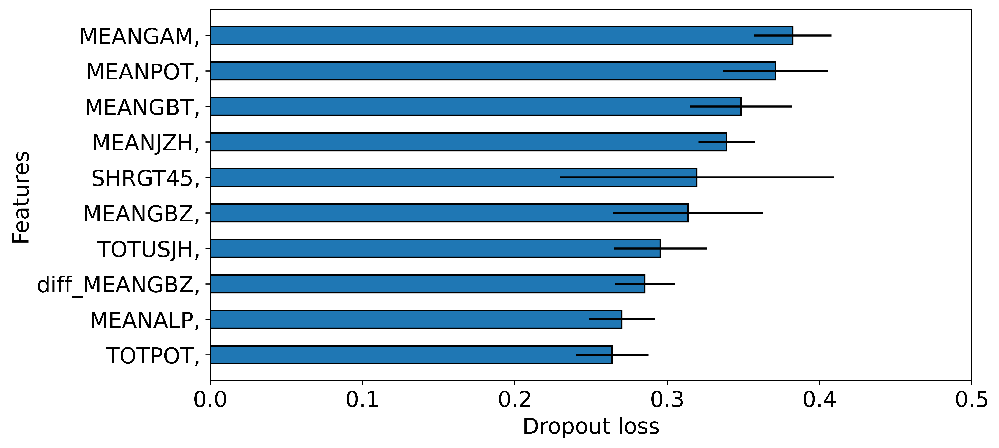

In [ ]:
plt.figure(figsize=(10,5),dpi=300)
plt.xlim (0,0.5,0.5)
plt.barh(l.variable.iloc[np.argsort(LDA_m_loss)[(feature_n-top_n):]],np.array(LDA_m_loss)[np.argsort(LDA_m_loss)[(feature_n-top_n):]],xerr=np.array(LDA_std_loss)[np.argsort(LDA_m_loss)[(feature_n-top_n):]],height=0.5,edgecolor='black')
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.xlabel("Dropout loss", fontsize=16)
plt.ylabel("Features", fontsize=16)

Text(0, 0.5, 'Features')

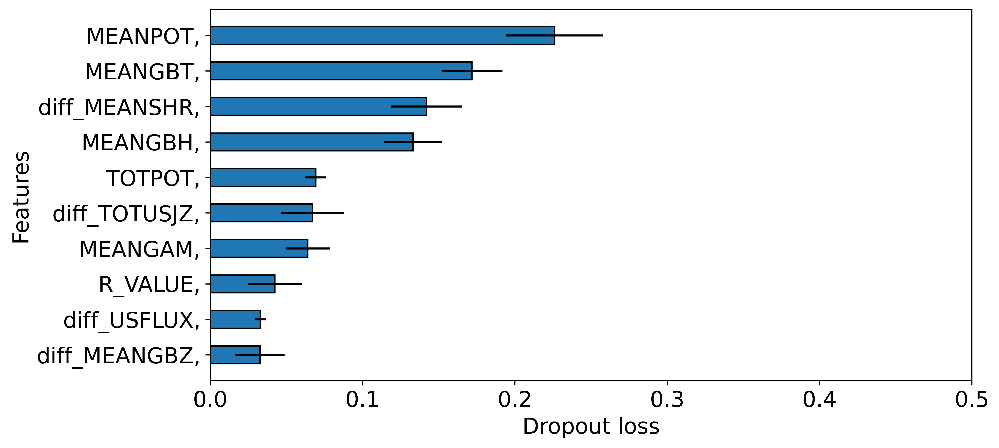

In [ ]:
plt.figure(figsize=(10,5),dpi=300)
plt.xlim (0,0.5,0.5)
plt.barh(l_svm.variable.iloc[np.argsort(SVM_m_loss)[(feature_n-top_n):]],np.array(SVM_m_loss)[np.argsort(SVM_m_loss)[(feature_n-top_n):]],xerr=np.array(SVM_std_loss)[np.argsort(SVM_m_loss)[(feature_n-top_n):]],height=0.5,edgecolor='black')
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.xlabel("Dropout loss", fontsize=16)
plt.ylabel("Features", fontsize=16)


###method2figure

Text(0, 0.5, 'Features')

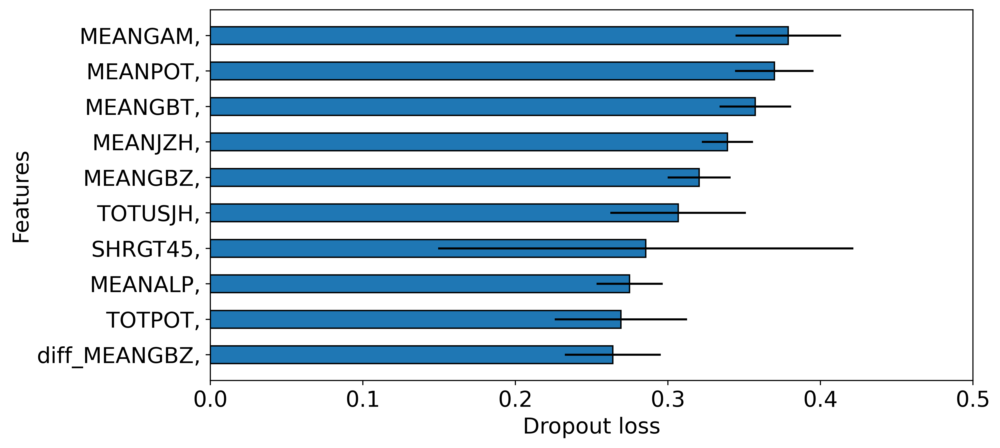

In [ ]:
plt.figure(figsize=(10,5),dpi=200)
plt.xlim (0,0.5,0.5)
plt.barh(l.variable.iloc[np.argsort(LDA_m_loss)[26:]],np.array(LDA_m_loss)[np.argsort(LDA_m_loss)[26:]],xerr=np.array(LDA_std_loss)[np.argsort(LDA_m_loss)[26:]],height=0.5,edgecolor='black')
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.xlabel("Dropout loss", fontsize=16)
plt.ylabel("Features", fontsize=16)

Text(0, 0.5, 'Features')

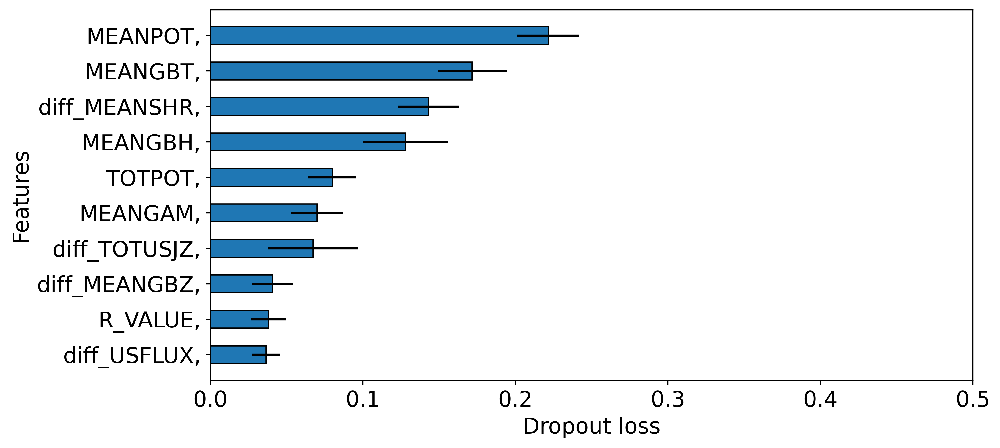

In [ ]:
plt.figure(figsize=(10,5),dpi=200)
plt.xlim (0,0.5,0.5)
plt.barh(l_svm.variable.iloc[np.argsort(SVM_m_loss)[26:]],np.array(SVM_m_loss)[np.argsort(SVM_m_loss)[26:]],xerr=np.array(SVM_std_loss)[np.argsort(SVM_m_loss)[26:]],height=0.5,edgecolor='black')
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.xlabel("Dropout loss", fontsize=16)
plt.ylabel("Features", fontsize=16)